In [2]:
#Import the necessary dependencies
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense, Dropout, Conv2D, MaxPooling2D, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [3]:
#Data importation
df = pd.read_csv("/content/wmt_data.csv")
df.head()

,date,open,high,low,close,adj_close,volume
0,2000-01-03 00:00:00-05:00,22.791668,23.000000,21.833332,22.270832,14.307388,25109700
1,2000-01-04 00:00:00-05:00,21.833332,21.937500,21.395832,21.437500,13.772032,20235300
2,2000-01-05 00:00:00-05:00,21.291668,21.458332,20.729168,21.000000,13.490974,21056100
3,2000-01-06 00:00:00-05:00,21.000000,21.520832,20.895832,21.229168,13.638196,19633500
4,2000-01-07 00:00:00-05:00,21.500000,22.979168,21.500000,22.833332,14.668746,23930700


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6345 entries, 0 to 6344
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   date       6345 non-null   object 
 1   open       6345 non-null   float64
 2   high       6345 non-null   float64
 3   low        6345 non-null   float64
 4   close      6345 non-null   float64
 5   adj_close  6345 non-null   float64
 6   volume     6345 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 347.1+ KB


In [5]:
# Convert 'date' column to datetime and remove timezone if present
df["date"] = pd.to_datetime(df["date"], utc=True).dt.tz_convert(None)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6345 entries, 0 to 6344
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       6345 non-null   datetime64[ns]
 1   open       6345 non-null   float64       
 2   high       6345 non-null   float64       
 3   low        6345 non-null   float64       
 4   close      6345 non-null   float64       
 5   adj_close  6345 non-null   float64       
 6   volume     6345 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 347.1 KB


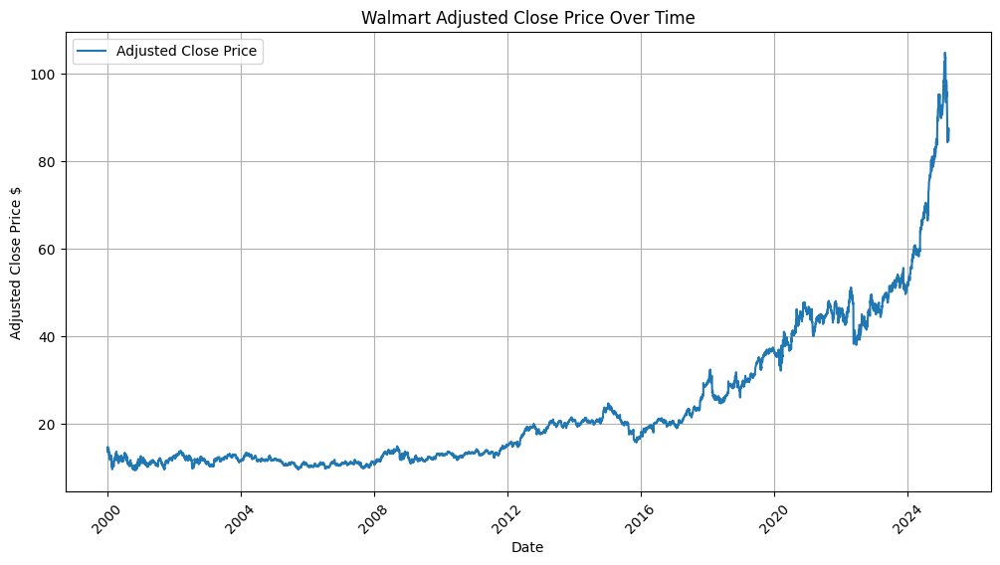

In [7]:
plt.figure(figsize=(12, 6))
plt.plot(df["date"], df["adj_close"], label='Adjusted Close Price')
plt.title('Walmart Adjusted Close Price Over Time')
plt.xlabel('Date')
plt.ylabel('Adjusted Close Price $')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

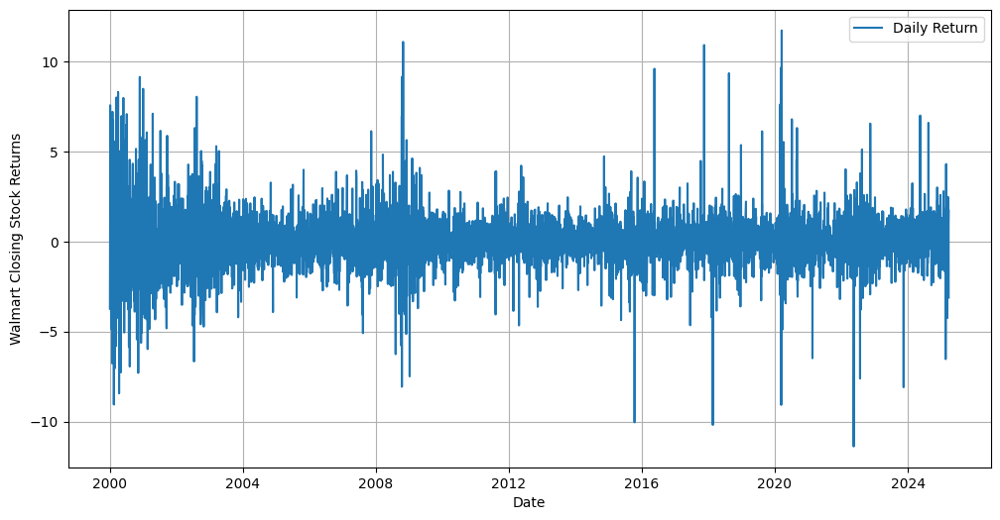

In [8]:
df["Daily_Return"] = df["adj_close"].pct_change() * 100
plt.figure(figsize=(12, 6))
plt.plot(df['date'], df["Daily_Return"], label= "Daily Return")
plt.xlabel('Date')
plt.ylabel('Walmart Closing Stock Returns')
plt.legend()
plt.grid(True)
plt.show()

<ipython-input-9-037c554bf1b4>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df["Year"], y=df["adj_close"], palette="coolwarm")


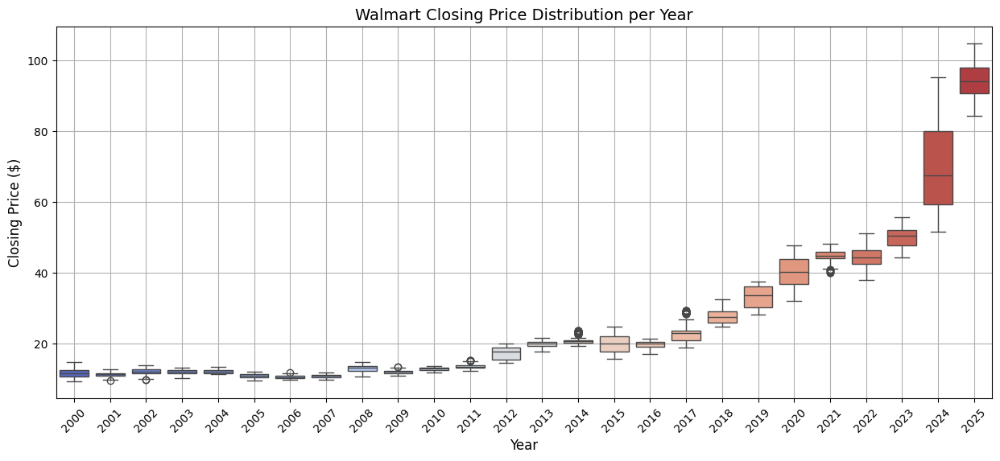

In [9]:
# Extract Year from Date
df["Year"] = df["date"].dt.year
# Plot Box Plot
plt.figure(figsize=(15, 6))
sns.boxplot(x=df["Year"], y=df["adj_close"], palette="coolwarm")
# Labels & Formatting
plt.title("Walmart Closing Price Distribution per Year", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Closing Price ($)", fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)

**USING A BATCH SIZE OF 64 to train the selected models in this study**

**LSTM**

Processing ticker: Walmart
Training with learning rate: 1e-05


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0546 - val_loss: 0.0475
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0418 - val_loss: 0.0357
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0330 - val_loss: 0.0245
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0202 - val_loss: 0.0143
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0126 - val_loss: 0.0067
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0068 - val_loss: 0.0034
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0049 - val_loss: 0.0020
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0037 - val_loss: 0.0011
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0030 - val_loss: 7.4871e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0026 - val_loss: 4.4666e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0023 - val_loss: 3.1921e-04
Epoch 12/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

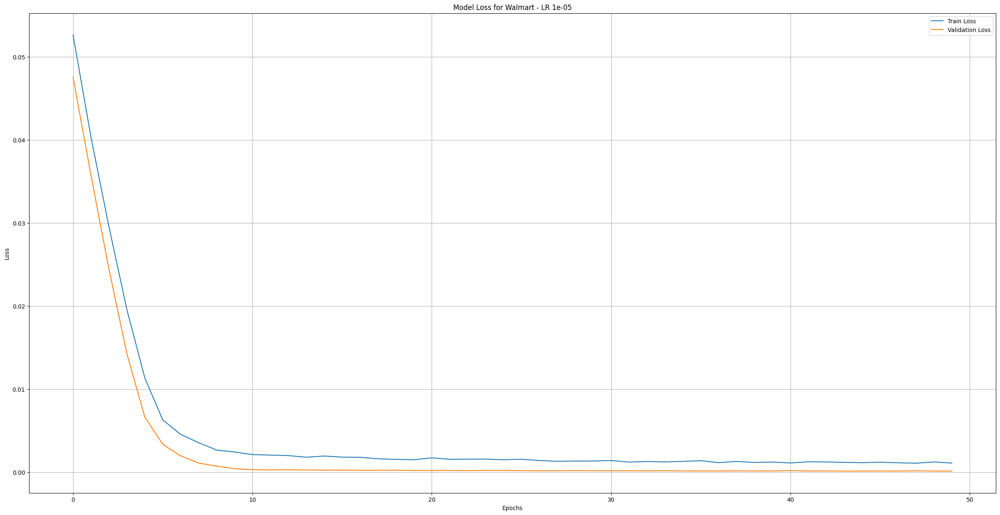

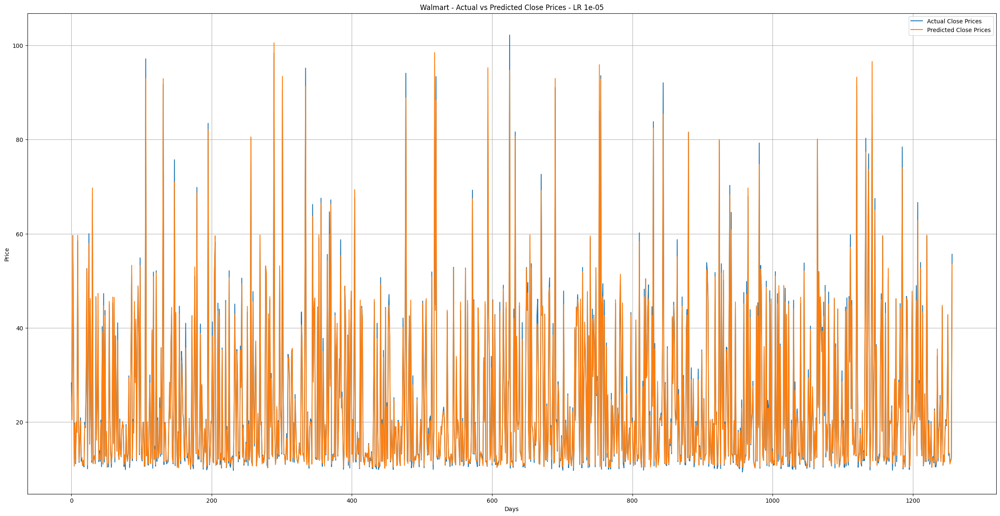

Training with learning rate: 0.0001
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.0329 - val_loss: 9.2267e-04
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0023 - val_loss: 2.4919e-04
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0018 - val_loss: 1.6353e-04
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0014 - val_loss: 1.7204e-04
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0013 - val_loss: 1.7577e-04
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0011 - val_loss: 1.8420e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011 - val_loss: 1.4597e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011 - val_loss: 1.3646e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011 - val_loss: 1.7056e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0010 - val_loss: 1.4907e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 9.7911e-04 - val_loss: 1.0971e-04
Epoch 12/50
63/63 ━━━━━━━━

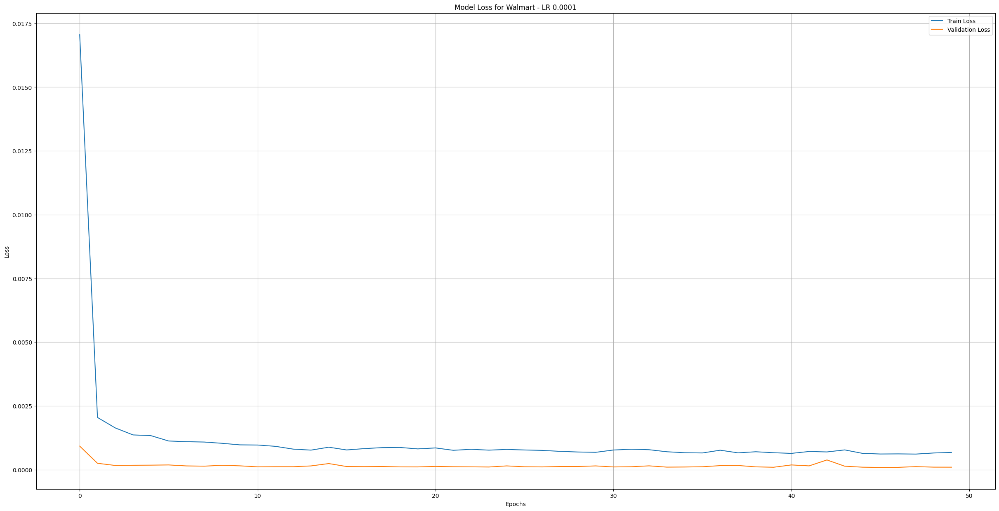

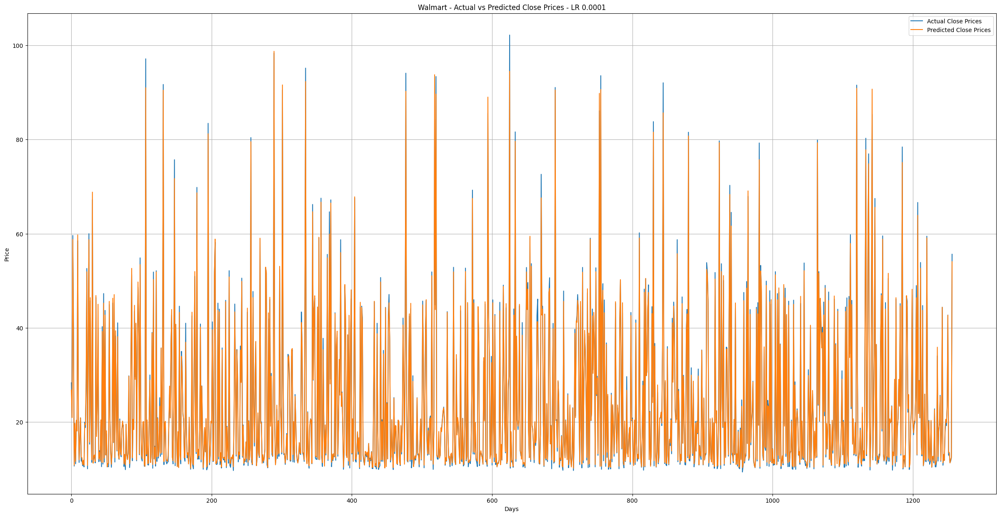

Training with learning rate: 0.001
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0083 - val_loss: 1.6643e-04
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0012 - val_loss: 4.1926e-04
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011 - val_loss: 1.3829e-04
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 9.3389e-04 - val_loss: 4.8572e-04
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011 - val_loss: 1.6971e-04
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 9.2366e-04 - val_loss: 3.0951e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 8.2781e-04 - val_loss: 2.2090e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 7.2299e-04 - val_loss: 2.5241e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 7.3799e-04 - val_loss: 2.4344e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 6.1656e-04 - val_loss: 8.9238e-05
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 6.0633e-04 - val_loss: 1.1065e-04
Ep

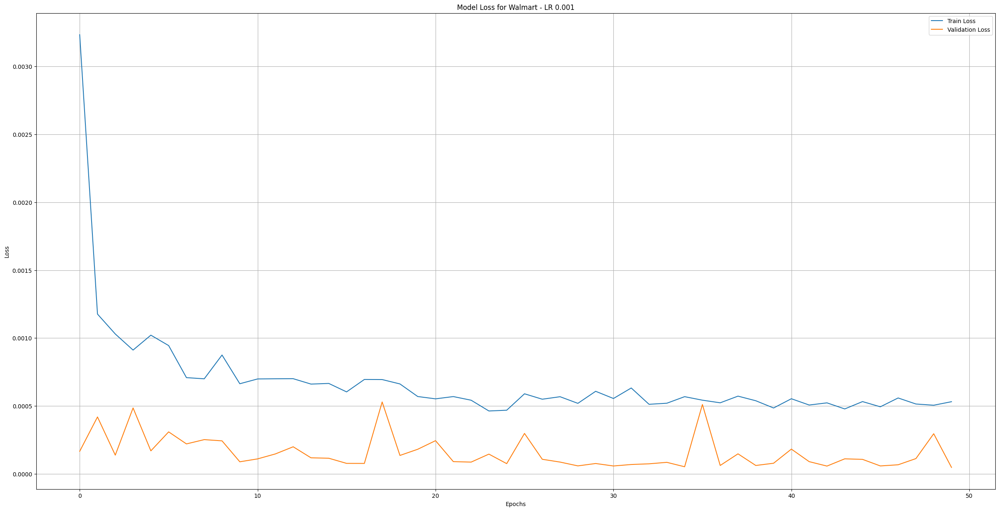

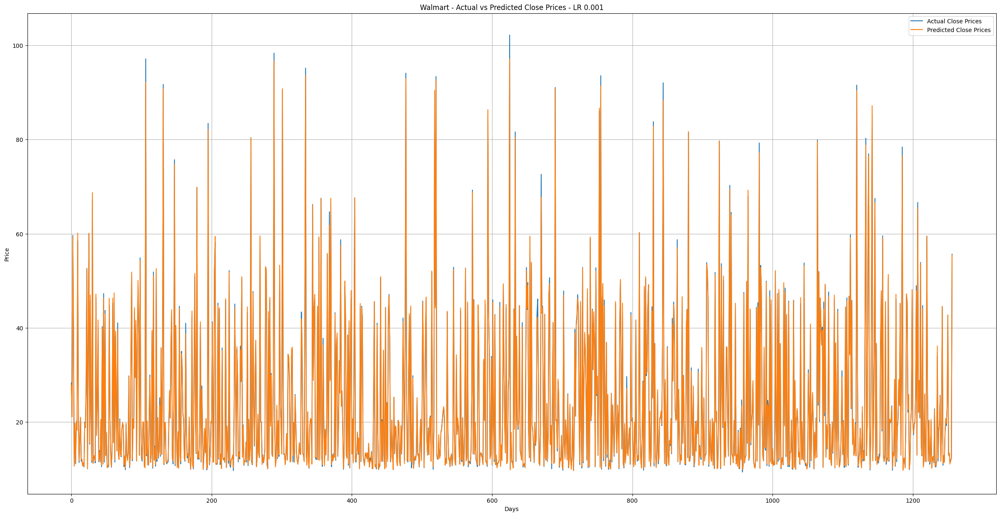

Training with learning rate: 0.01
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0237 - val_loss: 8.1183e-05
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0013 - val_loss: 5.8645e-04
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0014 - val_loss: 0.0018
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0011 - val_loss: 4.1939e-04
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 9.9369e-04 - val_loss: 1.5977e-04
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 6.9853e-04 - val_loss: 1.1857e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 8.2461e-04 - val_loss: 3.6050e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 8.3800e-04 - val_loss: 1.3919e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 7.1945e-04 - val_loss: 1.8090e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0011 - val_loss: 9.4416e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 9.7875e-04 - val_loss: 8.4717e-05
Epoch 12/5

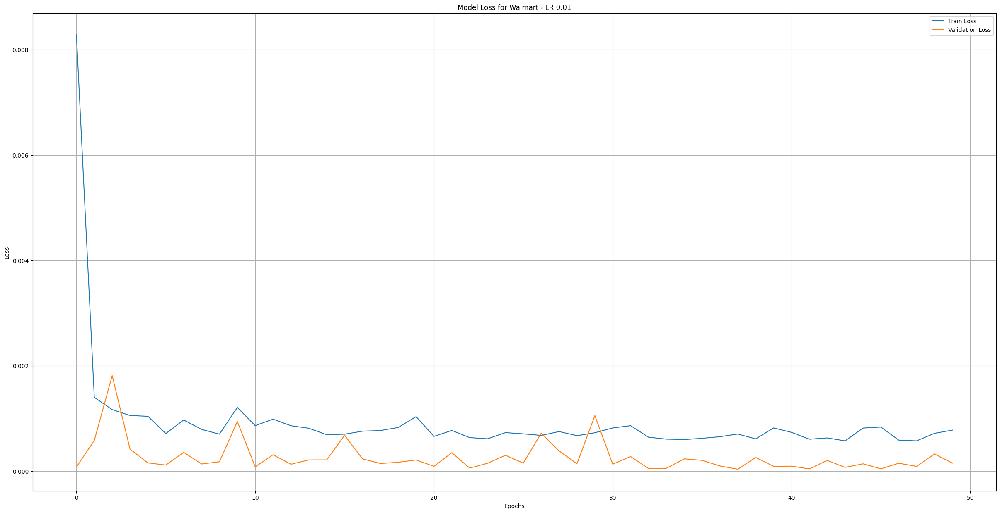

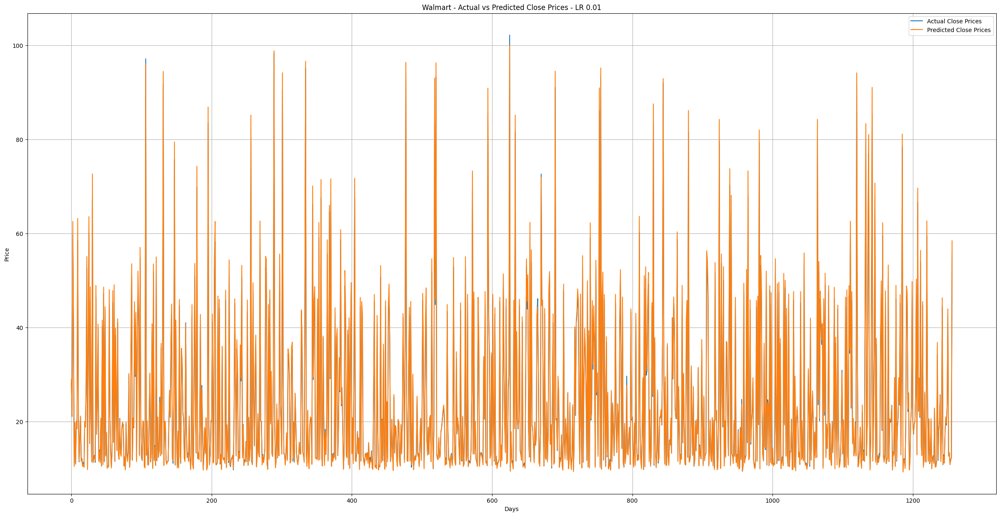

Training with learning rate: 0.1
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 9.2751 - val_loss: 0.0327
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0521 - val_loss: 0.0336
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0456 - val_loss: 0.0421
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0423 - val_loss: 0.0318
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0382 - val_loss: 0.0341
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0386 - val_loss: 0.0323
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0427 - val_loss: 0.0380
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0473 - val_loss: 0.0329
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0404 - val_loss: 0.0410
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0479 - val_loss: 0.0393
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0466 - val_loss: 0.0828
Epoch 12/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0729 - val_l

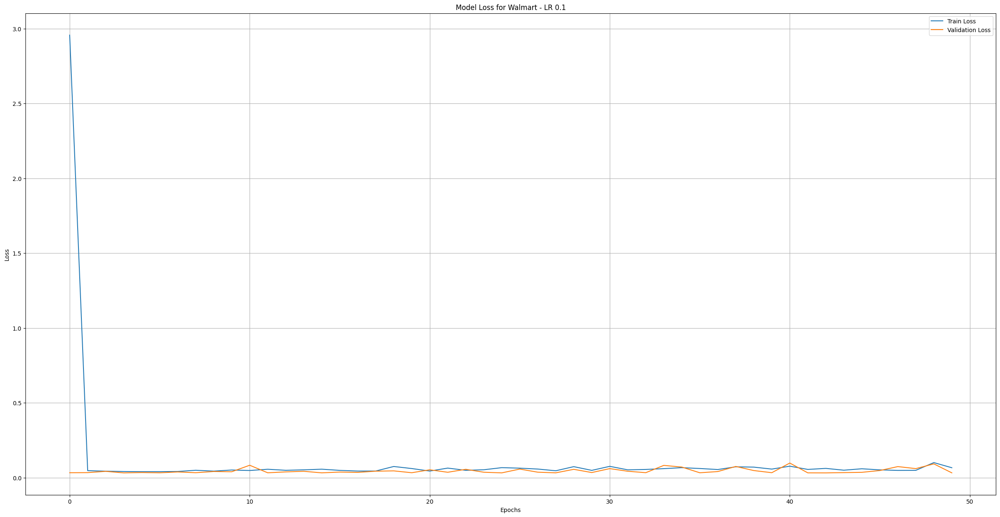

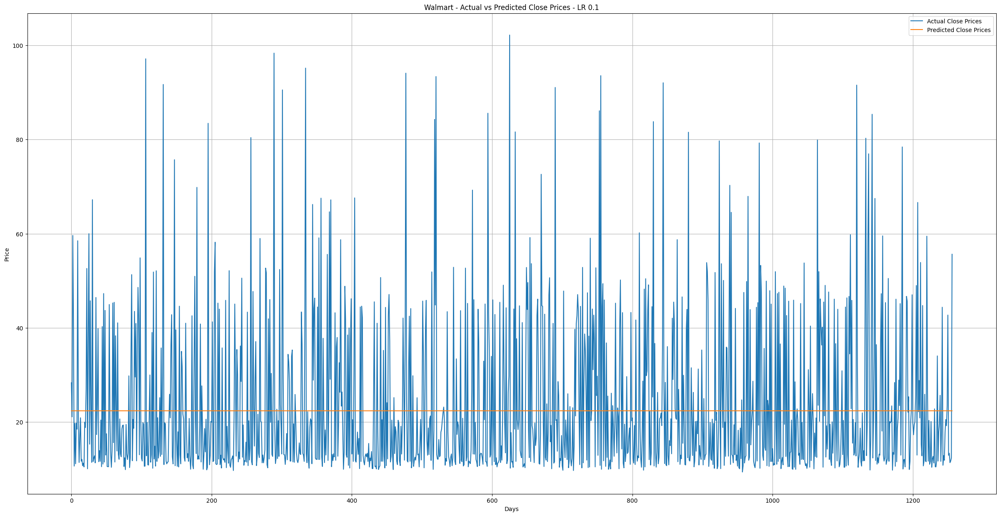

,0.00001,0.00010,0.00100,0.01000,0.10000
0,25.677794,26.779512,27.806530,28.972147,22.391266
1,20.470284,20.945566,21.115805,21.328812,22.392344
2,59.476353,58.786736,59.358173,62.551899,22.386175
3,35.415150,36.312283,37.828175,39.518883,22.389233
4,10.709998,10.853031,10.671511,10.428266,22.394203


In [10]:
def fit_lstm_individual(df, look_back=60, epochs=50, batch_size=64, learning_rates=[0.00001, 0.0001, 0.001, 0.01, 0.1]):
    """
    Fits an LSTM model to the adjusted close prices for Netflix using different learning rates.

    Parameters:
    - df: DataFrame containing adjusted close prices.
    - look_back: Number of past time steps to use as input features.
    - epochs: Number of epochs for training.
    - batch_size: Batch size for training.
    - learning_rates: List of learning rates to iterate over.

    Returns:
    - A dictionary with learning rates as keys and their trained models and predictions as values.
    - A DataFrame containing the predictions for Walmart.
    """
    results = {}
    predictions_dict = {}
    scaler = MinMaxScaler(feature_range=(0, 1))

    print("Processing ticker: Walmart")
    ticker_data = df["adj_close"].values.reshape(-1, 1)
    ticker_scaled = scaler.fit_transform(ticker_data)

    # Create dataset for time series modeling
    def create_dataset(data, look_back):
        X, Y = [], []
        for i in range(look_back, len(data)):
            X.append(data[i - look_back:i, 0])
            Y.append(data[i, 0])
        return np.array(X), np.array(Y)

    X, y = create_dataset(ticker_scaled, look_back)

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Reshape input for LSTM
    X_train = X_train.reshape(X_train.shape[0], look_back, 1)
    X_test = X_test.reshape(X_test.shape[0], look_back, 1)

    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # LSTM model
        model = Sequential()
        model.add(LSTM(100, return_sequences=True, input_shape=(look_back, 1)))
        model.add(Dropout(0.5))
        model.add(LSTM(100, return_sequences=False))
        model.add(Dropout(0.5))
        model.add(Dense(1))

        # Compile the model
        optimizer = Adam(learning_rate=lr)
        model.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = model.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            validation_split=0.2,
            verbose=1
        )

        # Predictions
        y_pred = model.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Save predictions
        predictions_dict[lr] = y_pred_inv.flatten()

        # Calculate metrics
        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        r_squared = r2_score(y_test_inv, y_pred_inv)
        final_loss = history.history['loss'][-1]

        print(f"Walmart - Learning Rate: {lr} - RMSE: {rmse}, MAE: {mae}, R-squared: {r_squared}, Loss: {final_loss}")

        # Save results
        results[lr] = {
            'model': model,
            'predictions': y_pred_inv,
            'actuals': y_test_inv,
            'metrics': {
                'RMSE': rmse,
                'MAE': mae,
                'R-squared': r_squared,
                'Loss': final_loss
            },
            'history': history.history
        }

        # Plot training & validation loss
        plt.figure(figsize=(30, 15))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss for Walmart - LR {lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the results
        plt.figure(figsize=(30, 15))
        plt.plot(y_test_inv, label='Actual Close Prices')
        plt.plot(y_pred_inv, label='Predicted Close Prices')
        plt.title(f'Walmart - Actual vs Predicted Close Prices - LR {lr}')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Convert predictions dictionary to DataFrame
    prediction = pd.DataFrame(predictions_dict)
    return results, prediction

results, prediction = fit_lstm_individual(df)
prediction.head()

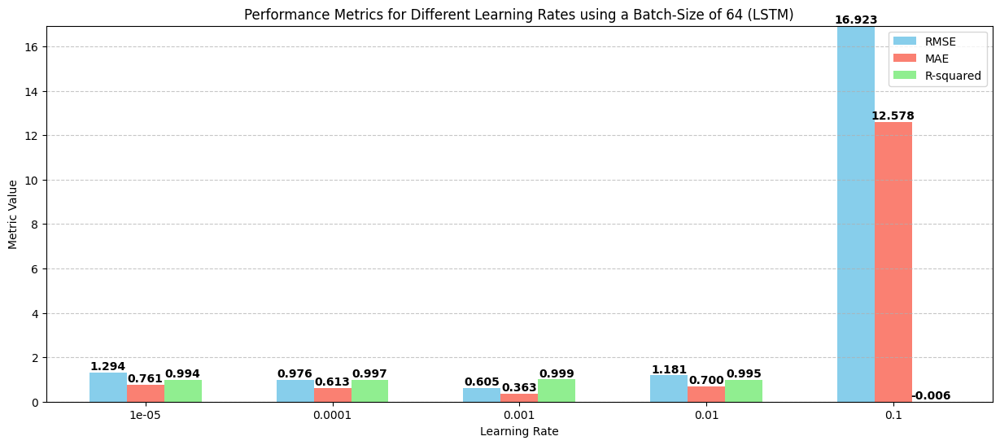

In [11]:
# Extract metrics from the results dictionary
learning_rates_list = list(results.keys())
rmses = [results[lr]['metrics']['RMSE'] for lr in learning_rates_list]
maes = [results[lr]['metrics']['MAE'] for lr in learning_rates_list]
r2s = [results[lr]['metrics']['R-squared'] for lr in learning_rates_list]

# Set width for grouped bars
bar_width = 0.2
x = np.arange(len(learning_rates_list))

plt.figure(figsize=(15, 6))

# Plot bars for RMSE, MAE, and R-squared
plt.bar(x - bar_width, rmses, width=bar_width, color='skyblue', label='RMSE')
plt.bar(x, maes, width=bar_width, color='salmon', label='MAE')
plt.bar(x + bar_width, r2s, width=bar_width, color='lightgreen', label='R-squared')

# Add labels
plt.xlabel('Learning Rate')
plt.ylabel('Metric Value')
plt.title('Performance Metrics for Different Learning Rates using a Batch-Size of 64 (LSTM)')
plt.xticks(x, learning_rates_list)  # Set x-axis labels to learning rates
plt.ylim(0, max(max(rmses), max(maes), 1.05))  # Adjust y-axis range
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
def add_value_labels(ax, values, x_positions, offset):
    for i, val in enumerate(values):
        ax.text(x_positions[i], val + offset, f'{val:.3f}', ha='center', va='bottom', fontweight='bold')
ax = plt.gca()
add_value_labels(ax, rmses, x - bar_width, 0.02)
add_value_labels(ax, maes, x, 0.02)
add_value_labels(ax, r2s, x + bar_width, 0.02)
plt.show()

**CNN+GRU-LSTM**

Processing ticker: Walmart
Training with learning rate: 1e-05
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


63/63 ━━━━━━━━━━━━━━━━━━━━ 30s 135ms/step - loss: 0.0486 - val_loss: 0.0337
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0283 - val_loss: 0.0168
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.0149 - val_loss: 0.0074
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 0.0071 - val_loss: 0.0035
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0039 - val_loss: 0.0014
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.0024 - val_loss: 4.2918e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 0.0015 - val_loss: 2.0307e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0013 - val_loss: 1.7894e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.0011 - val_loss: 1.6973e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.0012 - val_loss: 1.7157e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step - loss: 0.0012 - val_loss: 1.6687e-04
Epoch 12/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/s

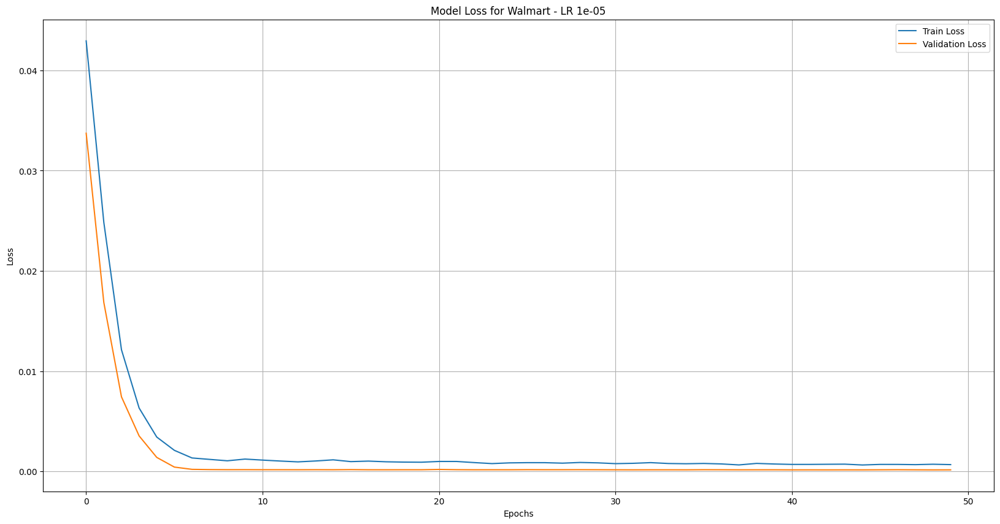

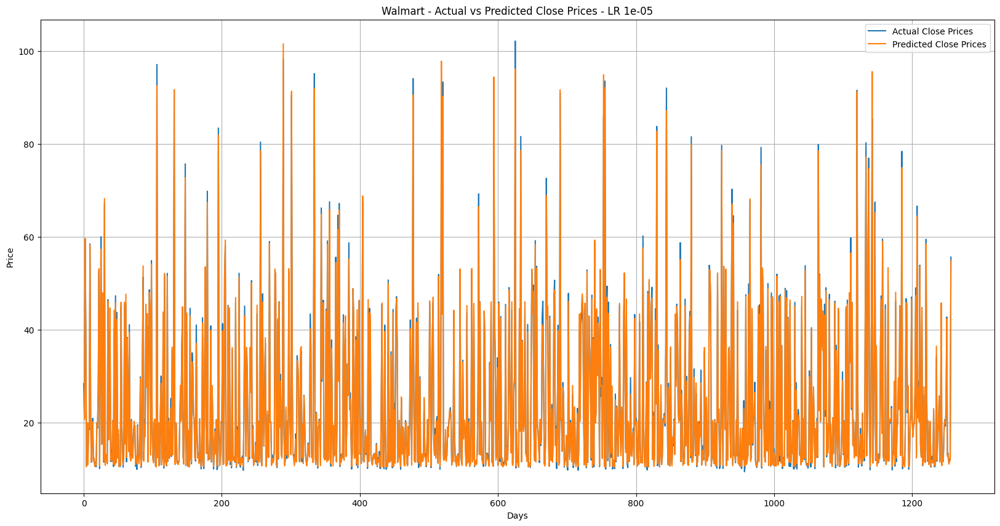

Training with learning rate: 0.0001
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


63/63 ━━━━━━━━━━━━━━━━━━━━ 29s 142ms/step - loss: 0.0231 - val_loss: 3.1853e-04
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 9.2965e-04 - val_loss: 2.1283e-04
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 9.1126e-04 - val_loss: 2.5518e-04
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 7.6021e-04 - val_loss: 2.6498e-04
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - loss: 8.5319e-04 - val_loss: 1.8112e-04
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 7.1248e-04 - val_loss: 1.7094e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 6.1118e-04 - val_loss: 2.2719e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 6.3703e-04 - val_loss: 1.7211e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 6.2821e-04 - val_loss: 1.4658e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 5.8294e-04 - val_loss: 1.4372e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 5.8910e-04 - val_loss:

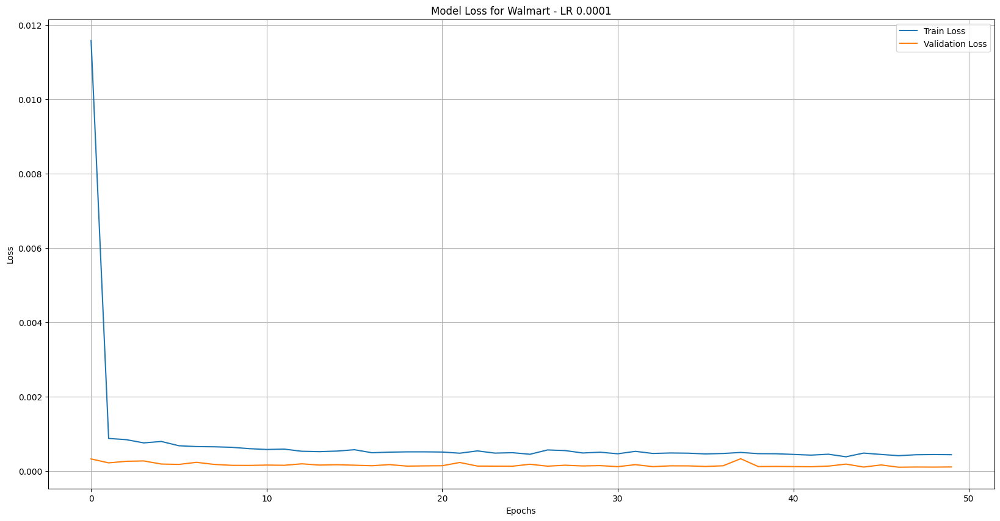

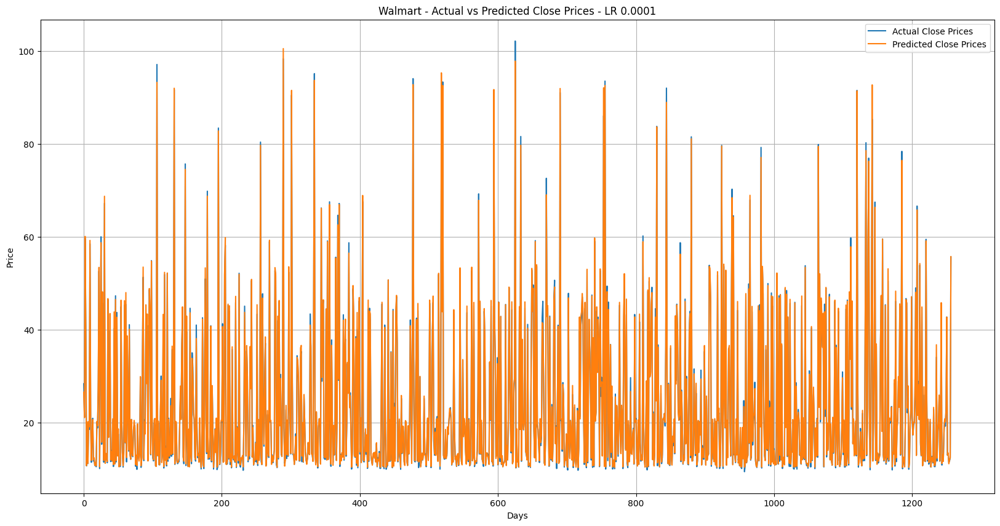

Training with learning rate: 0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0098 - val_loss: 8.1029e-04
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 9.4282e-04 - val_loss: 1.9812e-04
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - loss: 8.5698e-04 - val_loss: 0.0012
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 8.5376e-04 - val_loss: 1.6953e-04
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - loss: 6.4304e-04 - val_loss: 1.4425e-04
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 5.6630e-04 - val_loss: 1.2852e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 5.4622e-04 - val_loss: 1.2608e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - loss: 6.1184e-04 - val_loss: 1.8911e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - loss: 5.7723e-04 - val_loss: 3.4892e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 5.3572e-04 - val_loss: 2.1499e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - loss: 5.8205e-04 - va

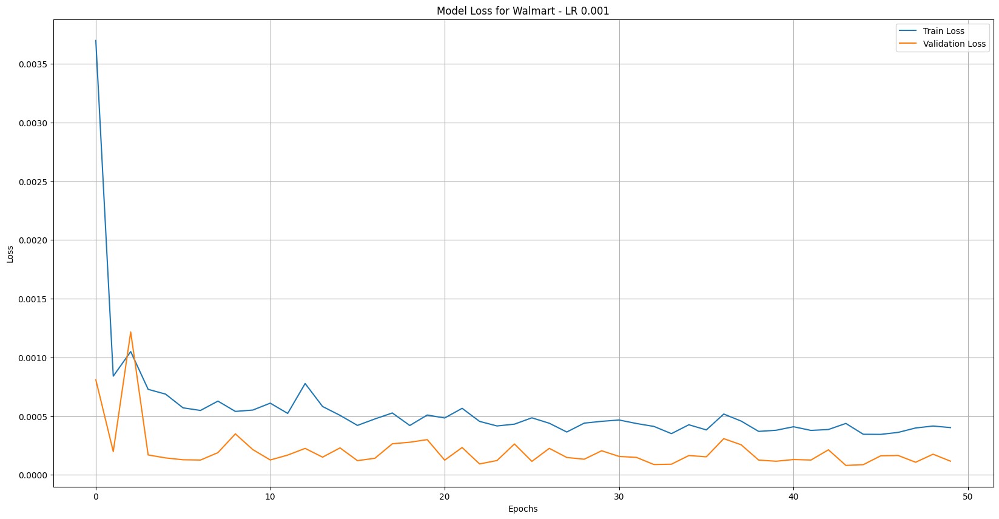

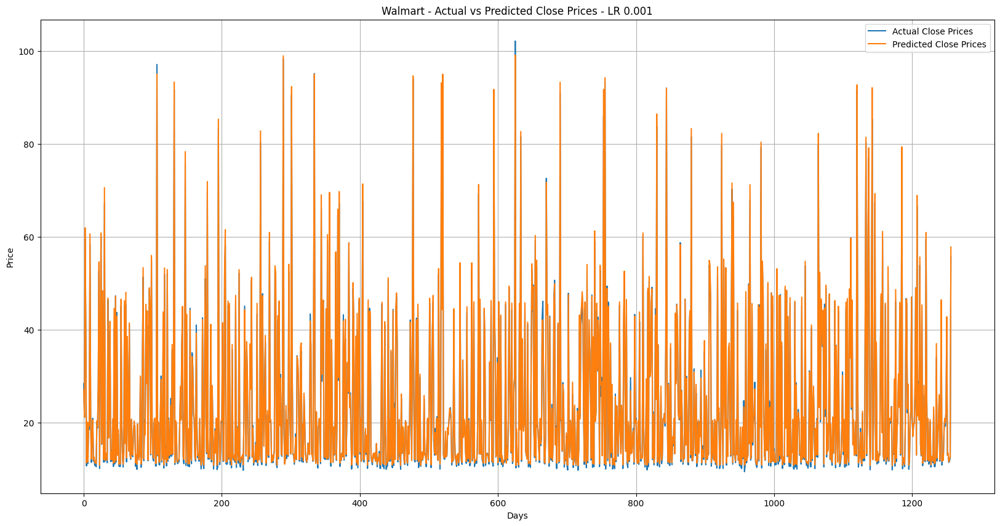

Training with learning rate: 0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 29s 136ms/step - loss: 0.0707 - val_loss: 3.2016e-04
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.0012 - val_loss: 4.5813e-04
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 0.0011 - val_loss: 3.0932e-04
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 9.1163e-04 - val_loss: 2.3342e-04
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.0011 - val_loss: 3.0272e-04
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 6.3359e-04 - val_loss: 3.9595e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 7.5105e-04 - val_loss: 1.5578e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 5.9198e-04 - val_loss: 3.0084e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 6.7915e-04 - val_loss: 1.9295e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 6.1563e-04 - val_loss: 2.3870e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 6.2354e-04 - val_loss: 

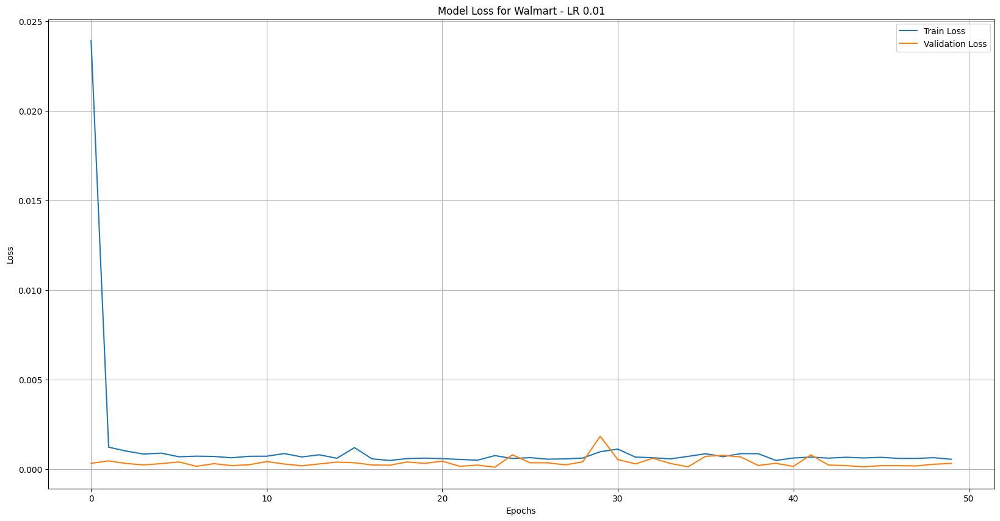

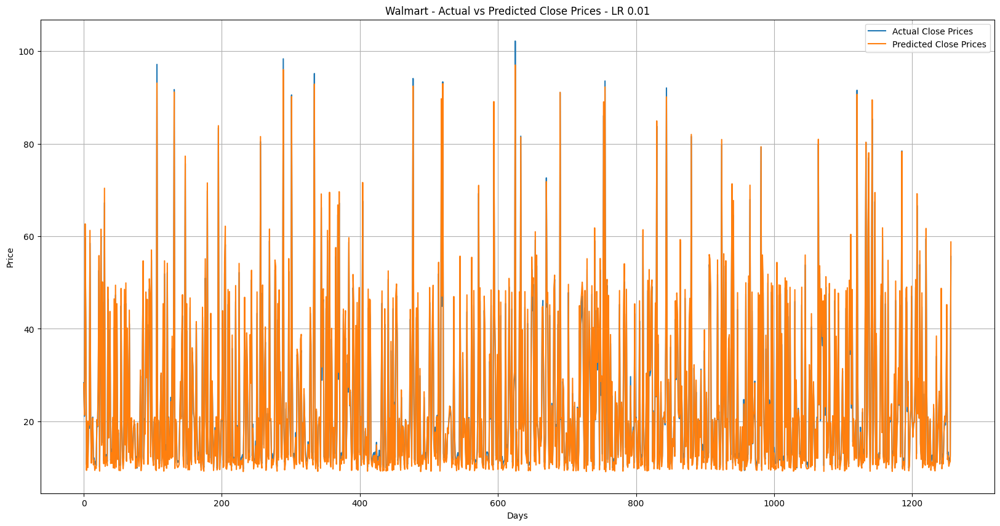

Training with learning rate: 0.1


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 5.2734 - val_loss: 0.0659
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - loss: 0.0704 - val_loss: 0.0343
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - loss: 0.0501 - val_loss: 0.0555
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.0768 - val_loss: 0.0318
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - loss: 0.0967 - val_loss: 0.0943
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1059 - val_loss: 0.3476
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2797 - val_loss: 0.0469
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1269 - val_loss: 0.0449
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1340 - val_loss: 0.0316
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - loss: 0.0823 - val_loss: 0.1233
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step - loss: 0.1989 - val_loss: 0.1050
Epoch 12/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0

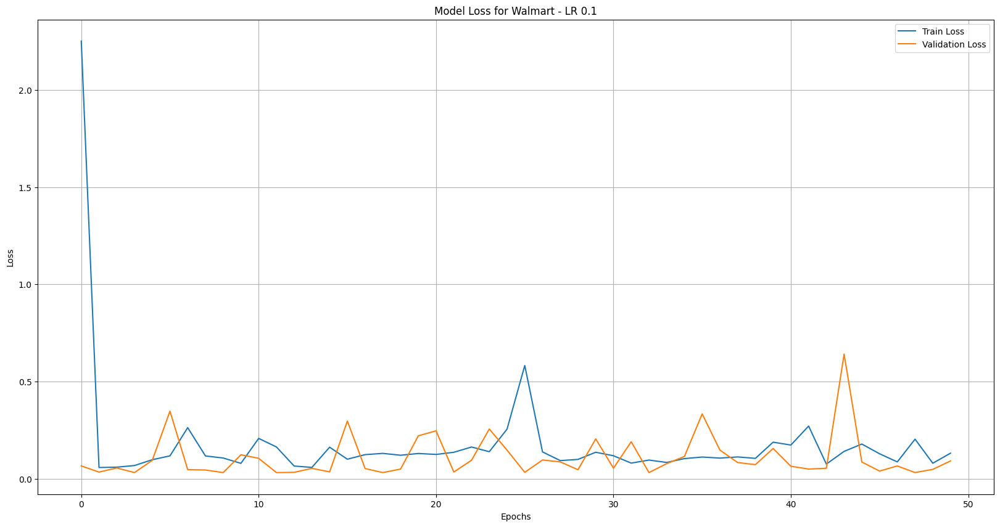

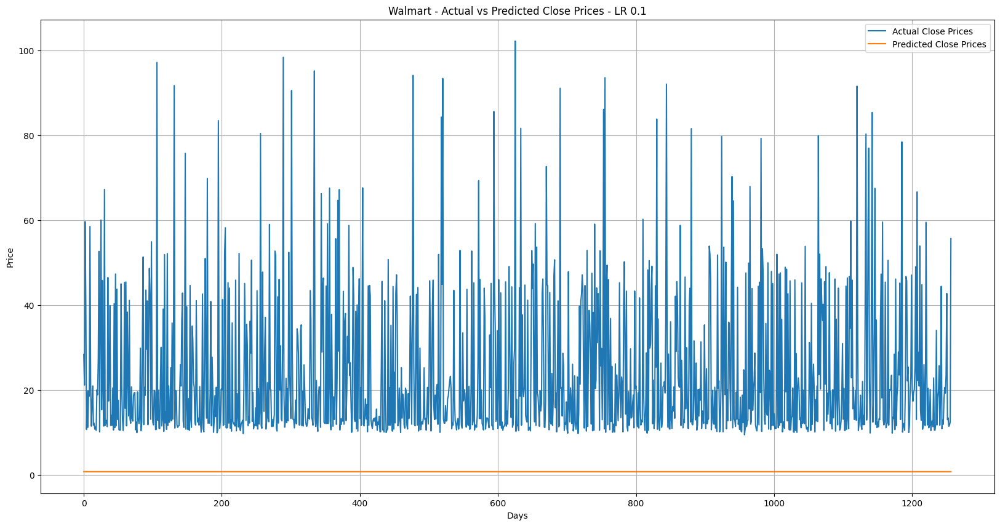

,0.00001,0.00010,0.00100,0.01000,0.10000
0,25.542072,26.500130,26.915468,28.140209,0.703844
1,20.654224,21.069946,21.140961,21.334143,0.703844
2,59.608273,60.084026,61.934803,62.665939,0.703844
3,36.590126,37.450340,38.464718,40.321156,0.703844
4,10.492744,10.697702,11.273617,9.412657,0.703844


In [12]:
def fit_cnn_gru_lstm_individual(df, look_back=60, epochs=50, batch_size=64, learning_rates=[0.00001, 0.0001, 0.001, 0.01, 0.1]):
    """
    Fits an CNN+GRU-LSTM model to the adjusted close prices for Netflix using different learning rates.

    Parameters:
    - df: DataFrame containing adjusted close prices.
    - look_back: Number of past time steps to use as input features.
    - epochs: Number of epochs for training.
    - batch_size: Batch size for training.
    - learning_rates: List of learning rates to iterate over.

    Returns:
    - A dictionary with learning rates as keys and their trained models and predictions as values.
    - A DataFrame containing the predictions for Walmart.
    """
    results = {}
    predictions_dict = {}
    scaler = MinMaxScaler(feature_range=(0, 1))

    print("Processing ticker: Walmart")
    ticker_data = df["adj_close"].values.reshape(-1, 1)
    ticker_scaled = scaler.fit_transform(ticker_data)

    # Create dataset for time series modeling
    def create_dataset(data, look_back):
        X, Y = [], []
        for i in range(look_back, len(data)):
            X.append(data[i - look_back:i, 0])
            Y.append(data[i, 0])
        return np.array(X), np.array(Y)

    X, y = create_dataset(ticker_scaled, look_back)

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Reshape input for CNN-LSTM
    X_train = X_train.reshape(X_train.shape[0], look_back, 1, 1, 1)
    X_test = X_test.reshape(X_test.shape[0], look_back, 1, 1, 1)

    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # CNN+GRU-LSTM model
        gl = Sequential()
        gl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu'),
                               input_shape=(look_back, 1, 1, 1)))
        gl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        gl.add(TimeDistributed(Conv2D(filters=128, kernel_size=(1, 1), activation='relu')))
        gl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        gl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu')))
        gl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        gl.add(TimeDistributed(Flatten()))
        gl.add(Bidirectional(GRU(100, return_sequences=True)))
        gl.add(Dropout(0.5))
        gl.add(Bidirectional(LSTM(100, return_sequences=False)))
        gl.add(Dropout(0.5))
        gl.add(Dense(1))

        # Compile the model
        optimizer = Adam(learning_rate=lr)
        gl.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = gl.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            validation_split=0.2,
            verbose=1
        )

        # Predictions
        y_pred = gl.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Save predictions
        predictions_dict[lr] = y_pred_inv.flatten()

        # Calculate metrics
        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        r_squared = r2_score(y_test_inv, y_pred_inv)
        final_loss = history.history['loss'][-1]

        print(f"Walmart - Learning Rate: {lr} - RMSE: {rmse}, MAE: {mae}, R-squared: {r_squared}, Loss: {final_loss}")

        # Save results
        results[lr] = {
            'model': gl,
            'predictions': y_pred_inv,
            'actuals': y_test_inv,
            'metrics': {
                'RMSE': rmse,
                'MAE': mae,
                'R-squared': r_squared,
                'Loss': final_loss
            },
            'history': history.history
        }

        # Plot training & validation loss
        plt.figure(figsize=(20, 10))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss for Walmart - LR {lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the results
        plt.figure(figsize=(20, 10))
        plt.plot(y_test_inv, label='Actual Close Prices')
        plt.plot(y_pred_inv, label='Predicted Close Prices')
        plt.title(f'Walmart - Actual vs Predicted Close Prices - LR {lr}')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Convert predictions dictionary to DataFrame
    prediction = pd.DataFrame(predictions_dict)
    return results, prediction


results, prediction = fit_cnn_gru_lstm_individual(df)
prediction.head()

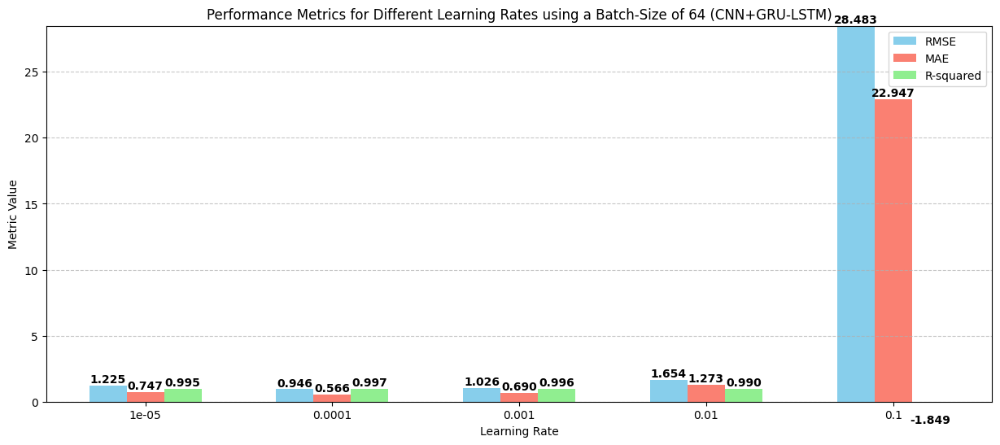

In [13]:
# Extract metrics from the results dictionary
learning_rates_list = list(results.keys())
rmses = [results[lr]['metrics']['RMSE'] for lr in learning_rates_list]
maes = [results[lr]['metrics']['MAE'] for lr in learning_rates_list]
r2s = [results[lr]['metrics']['R-squared'] for lr in learning_rates_list]

# Set width for grouped bars
bar_width = 0.2
x = np.arange(len(learning_rates_list))

plt.figure(figsize=(15, 6))

# Plot bars for RMSE, MAE, and R-squared
plt.bar(x - bar_width, rmses, width=bar_width, color='skyblue', label='RMSE')
plt.bar(x, maes, width=bar_width, color='salmon', label='MAE')
plt.bar(x + bar_width, r2s, width=bar_width, color='lightgreen', label='R-squared')

# Add labels
plt.xlabel('Learning Rate')
plt.ylabel('Metric Value')
plt.title('Performance Metrics for Different Learning Rates using a Batch-Size of 64 (CNN+GRU-LSTM)')
plt.xticks(x, learning_rates_list)  # Set x-axis labels to learning rates
plt.ylim(0, max(max(rmses), max(maes), 1.05))  # Adjust y-axis range
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
def add_value_labels(ax, values, x_positions, offset):
    for i, val in enumerate(values):
        ax.text(x_positions[i], val + offset, f'{val:.3f}', ha='center', va='bottom', fontweight='bold')
ax = plt.gca()
add_value_labels(ax, rmses, x - bar_width, 0.02)
add_value_labels(ax, maes, x, 0.02)
add_value_labels(ax, r2s, x + bar_width, 0.02)
plt.show()

**CNN+Bi-LSTM**

Processing ticker: Walmart
Training with learning rate: 1e-05
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


63/63 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0482 - val_loss: 0.0413
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - loss: 0.0388 - val_loss: 0.0264
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.0225 - val_loss: 0.0134
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.0109 - val_loss: 0.0068
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.0065 - val_loss: 0.0028
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.0032 - val_loss: 6.3207e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.0013 - val_loss: 2.3687e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - loss: 0.0010 - val_loss: 1.9937e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step - loss: 9.2596e-04 - val_loss: 1.9628e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - loss: 9.5778e-04 - val_loss: 1.9614e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.0011 - val_loss: 1.9354e-04
Epoch 12/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4

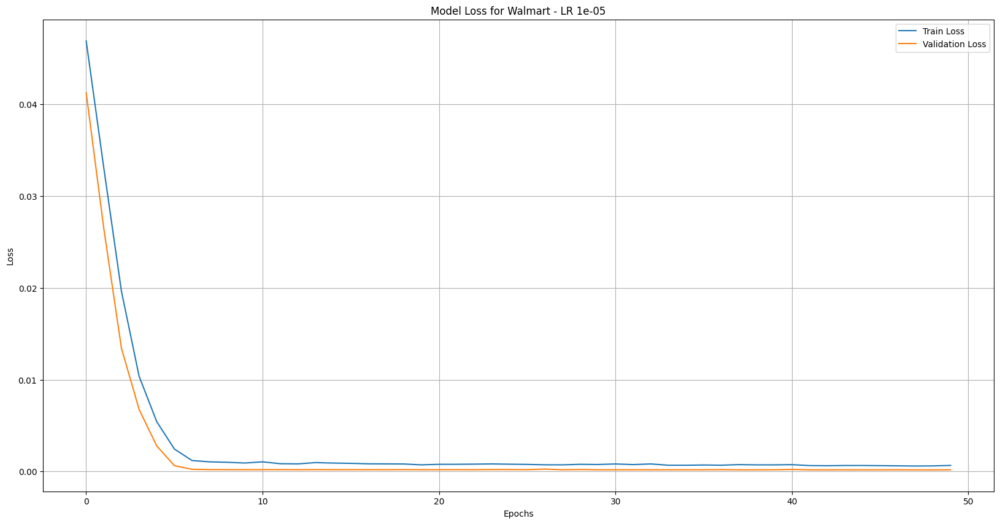

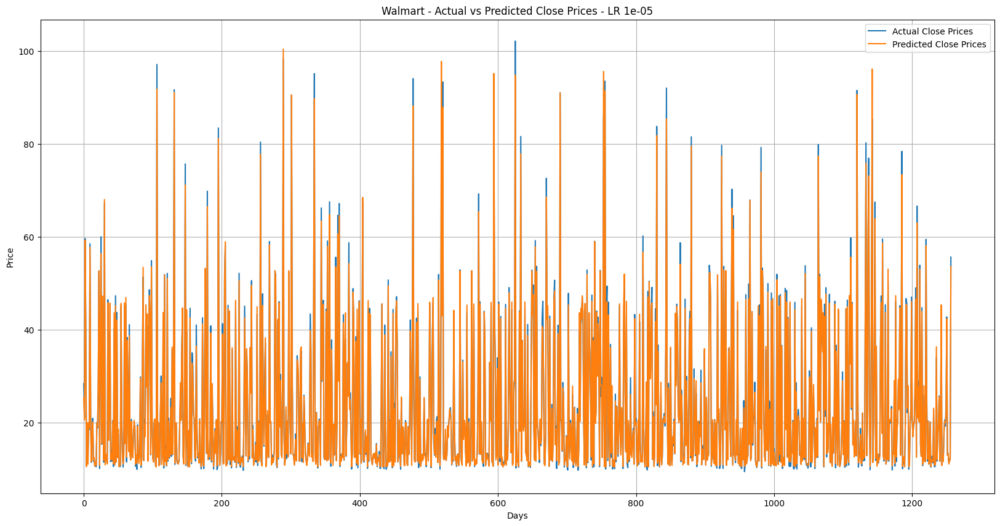

Training with learning rate: 0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.0274 - val_loss: 2.9035e-04
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0011 - val_loss: 2.1714e-04
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - loss: 8.3080e-04 - val_loss: 1.9287e-04
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 8.6206e-04 - val_loss: 1.9316e-04
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 7.4521e-04 - val_loss: 1.7529e-04
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step - loss: 7.2270e-04 - val_loss: 2.8695e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 6.9946e-04 - val_loss: 1.7373e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 5.5169e-04 - val_loss: 1.6374e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step - loss: 8.5908e-04 - val_loss: 1.5536e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - loss: 6.5596e-04 - val_loss: 1.6436e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 5.9338e-04 - va

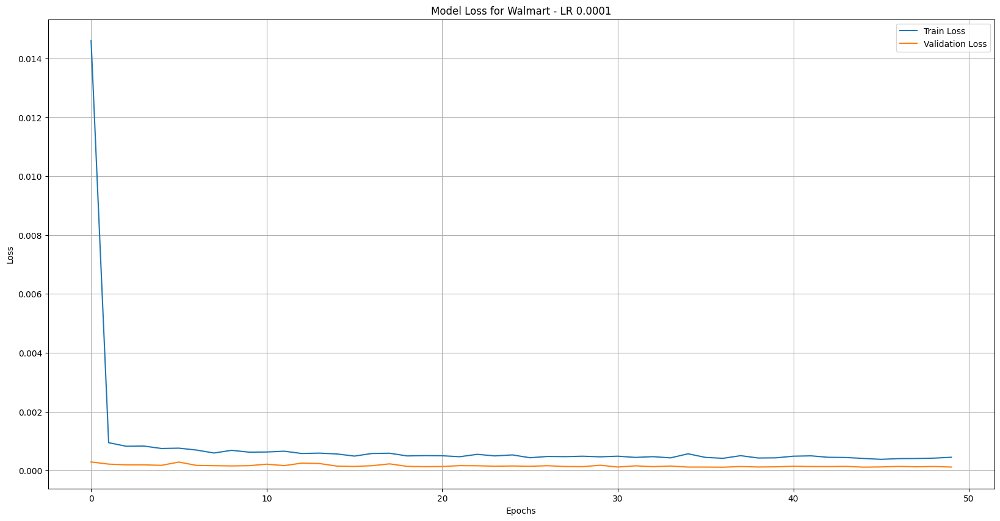

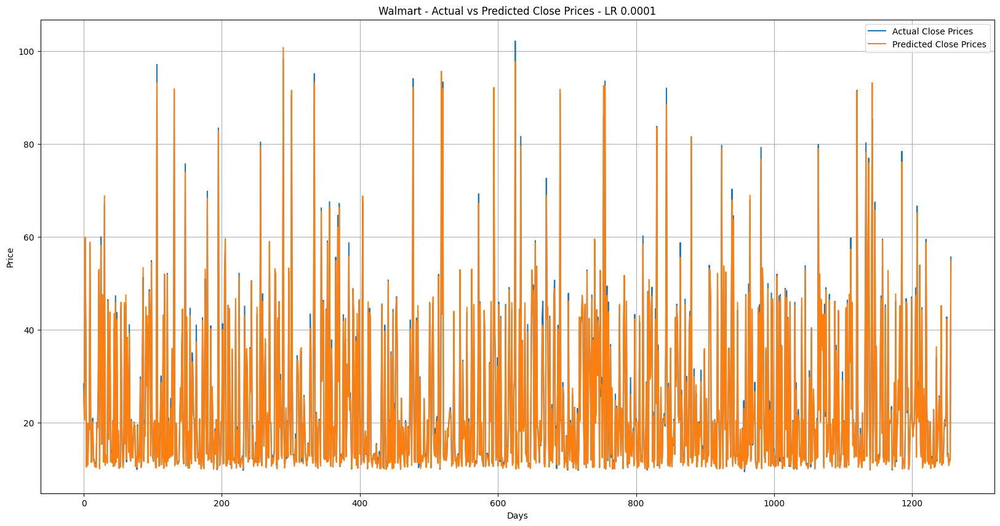

Training with learning rate: 0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 29s 141ms/step - loss: 0.0107 - val_loss: 1.8885e-04
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 6.8743e-04 - val_loss: 5.8109e-04
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - loss: 7.6532e-04 - val_loss: 1.9326e-04
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 6.1197e-04 - val_loss: 4.1904e-04
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step - loss: 9.7586e-04 - val_loss: 2.0396e-04
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 6.1347e-04 - val_loss: 2.6732e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 4.8934e-04 - val_loss: 1.9830e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step - loss: 6.9131e-04 - val_loss: 2.0241e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 6.2813e-04 - val_loss: 4.0377e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 5.6449e-04 - val_loss: 1.3163e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - loss: 5.5497e-04 

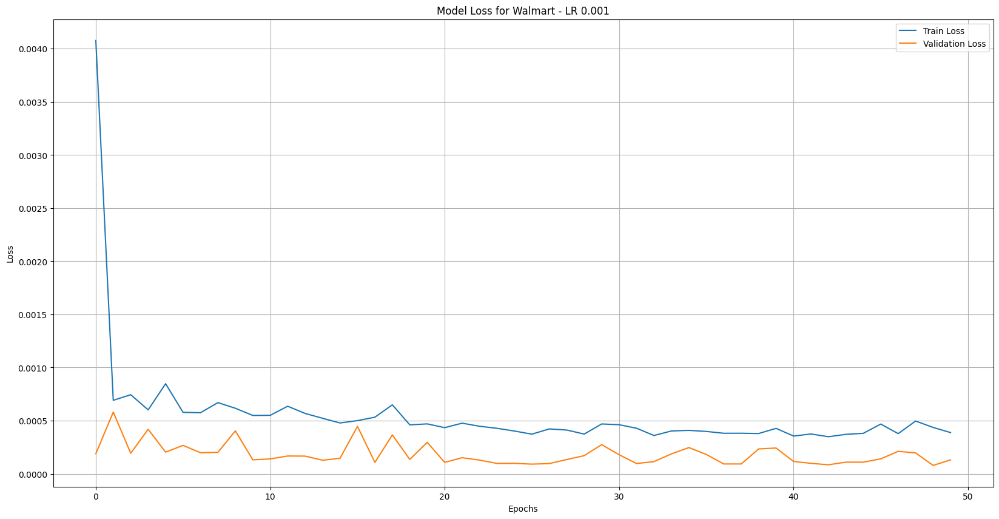

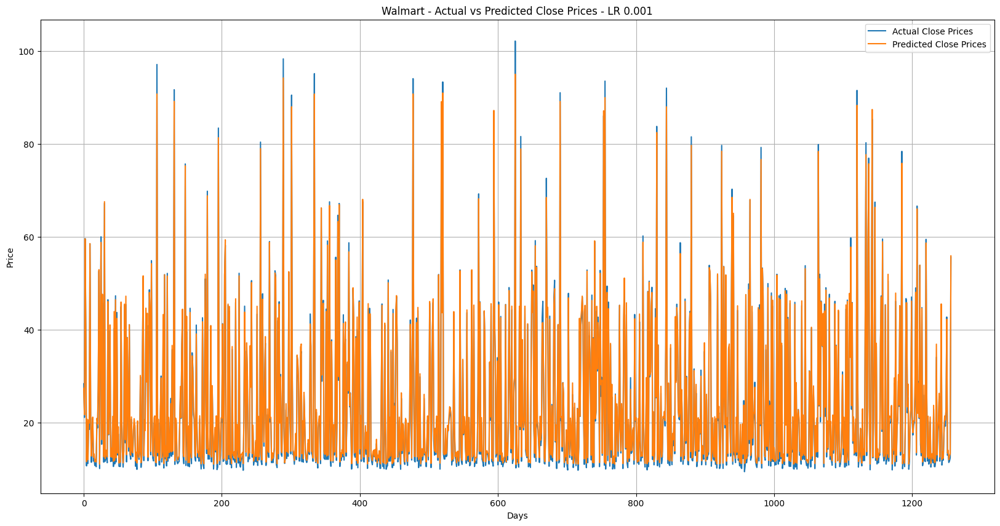

Training with learning rate: 0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0750 - val_loss: 4.9069e-04
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - loss: 0.0012 - val_loss: 1.7028e-04
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 8.9816e-04 - val_loss: 1.8049e-04
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 7.6160e-04 - val_loss: 4.5370e-04
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.0011 - val_loss: 2.5299e-04
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 8.4432e-04 - val_loss: 6.3429e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 7.3549e-04 - val_loss: 4.2323e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step - loss: 0.0013 - val_loss: 1.6460e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 7.4094e-04 - val_loss: 4.4191e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 5.8556e-04 - val_loss: 1.2097e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 5.7825e-04 - val_loss: 

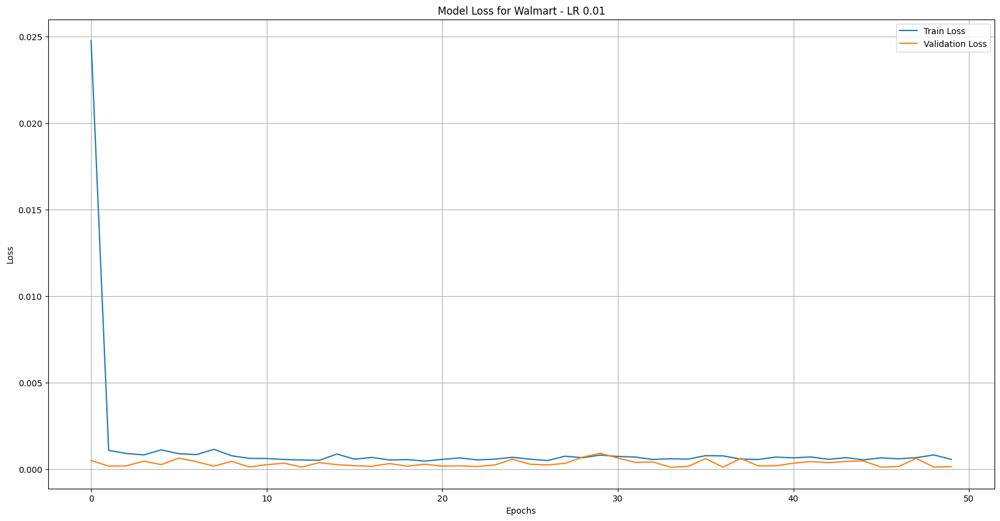

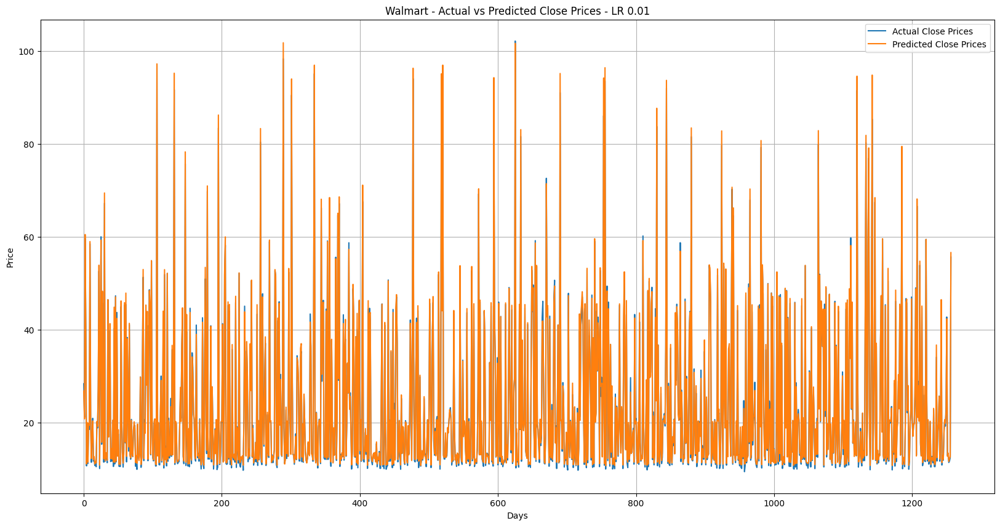

Training with learning rate: 0.1


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 13.2137 - val_loss: 0.0332
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0508 - val_loss: 0.0316
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.0397 - val_loss: 0.0372
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0409 - val_loss: 0.0579
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - val_loss: 0.0325
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0417 - val_loss: 0.0399
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.0477 - val_loss: 0.0865
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.0596 - val_loss: 0.0329
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0398 - val_loss: 0.0360
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.0442 - val_loss: 0.0339
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.0367 - val_loss: 0.0656
Epoch 12/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 

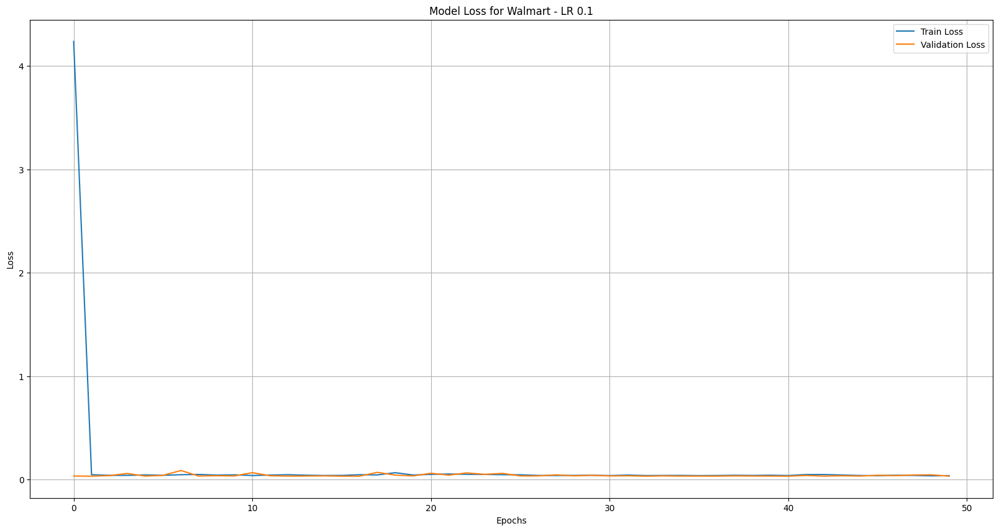

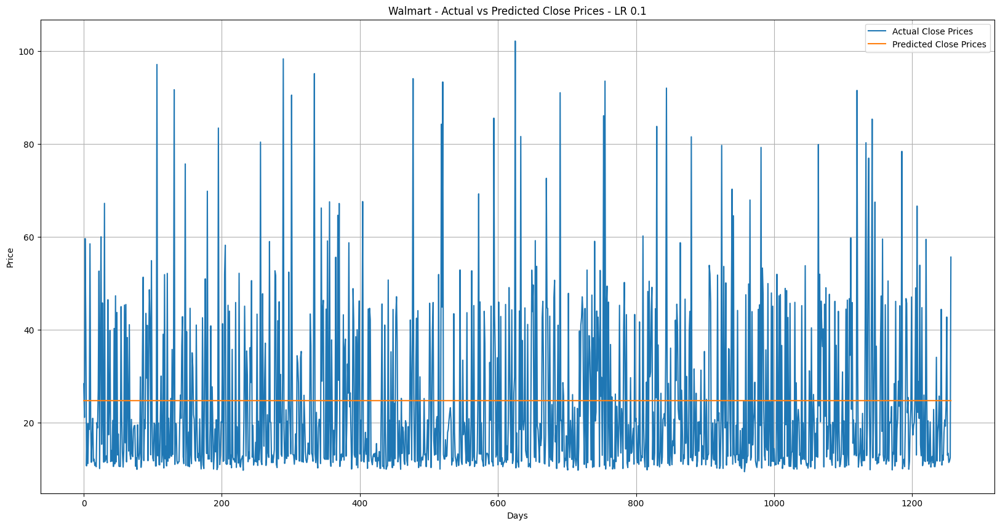

,0.00001,0.00010,0.00100,0.01000,0.10000
0,25.295053,25.729645,27.345108,26.763147,24.710354
1,20.574642,20.540073,21.675528,20.787001,24.710354
2,59.287224,59.935970,59.577049,60.495754,24.710354
3,36.130211,36.744854,38.366425,38.189697,24.710354
4,10.510737,10.371203,11.564128,11.070852,24.710354


In [14]:
def fit_cnn_bi_lstm_individual(df, look_back=60, epochs=50, batch_size=64, learning_rates=[0.00001, 0.0001, 0.001, 0.01, 0.1]):
    """
    Fits an CNN+BI-LSTM model to the adjusted close prices for Netflix using different learning rates.

    Parameters:
    - df: DataFrame containing adjusted close prices.
    - look_back: Number of past time steps to use as input features.
    - epochs: Number of epochs for training.
    - batch_size: Batch size for training.
    - learning_rates: List of learning rates to iterate over.

    Returns:
    - A dictionary with learning rates as keys and their trained models and predictions as values.
    - A DataFrame containing the predictions for Walmart.
    """
    results = {}
    predictions_dict = {}
    scaler = MinMaxScaler(feature_range=(0, 1))

    print("Processing ticker: Walmart")
    ticker_data = df["adj_close"].values.reshape(-1, 1)
    ticker_scaled = scaler.fit_transform(ticker_data)

    # Create dataset for time series modeling
    def create_dataset(data, look_back):
        X, Y = [], []
        for i in range(look_back, len(data)):
            X.append(data[i - look_back:i, 0])
            Y.append(data[i, 0])
        return np.array(X), np.array(Y)

    X, y = create_dataset(ticker_scaled, look_back)

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Reshape input for CNN-LSTM
    X_train = X_train.reshape(X_train.shape[0], look_back, 1, 1, 1)
    X_test = X_test.reshape(X_test.shape[0], look_back, 1, 1, 1)

    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # CNN+GRU-LSTM model
        cl = Sequential()
        cl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu'),
                               input_shape=(look_back, 1, 1, 1)))
        cl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cl.add(TimeDistributed(Conv2D(filters=128, kernel_size=(1, 1), activation='relu')))
        cl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu')))
        cl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cl.add(TimeDistributed(Flatten()))
        cl.add(Bidirectional(LSTM(100, return_sequences=True)))
        cl.add(Dropout(0.5))
        cl.add(Bidirectional(LSTM(100, return_sequences=False)))
        cl.add(Dropout(0.5))
        cl.add(Dense(1))

        # Compile the model
        optimizer = Adam(learning_rate=lr)
        cl.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = cl.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            validation_split=0.2,
            verbose=1
        )

        # Predictions
        y_pred = cl.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Save predictions
        predictions_dict[lr] = y_pred_inv.flatten()

        # Calculate metrics
        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        r_squared = r2_score(y_test_inv, y_pred_inv)
        final_loss = history.history['loss'][-1]

        print(f"Walmart - Learning Rate: {lr} - RMSE: {rmse}, MAE: {mae}, R-squared: {r_squared}, Loss: {final_loss}")

        # Save results
        results[lr] = {
            'model': cl,
            'predictions': y_pred_inv,
            'actuals': y_test_inv,
            'metrics': {
                'RMSE': rmse,
                'MAE': mae,
                'R-squared': r_squared,
                'Loss': final_loss
            },
            'history': history.history
        }

        # Plot training & validation loss
        plt.figure(figsize=(20, 10))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss for Walmart - LR {lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the results
        plt.figure(figsize=(20, 10))
        plt.plot(y_test_inv, label='Actual Close Prices')
        plt.plot(y_pred_inv, label='Predicted Close Prices')
        plt.title(f'Walmart - Actual vs Predicted Close Prices - LR {lr}')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Convert predictions dictionary to DataFrame
    prediction = pd.DataFrame(predictions_dict)
    return results, prediction


results, prediction = fit_cnn_bi_lstm_individual(df)
prediction.head()

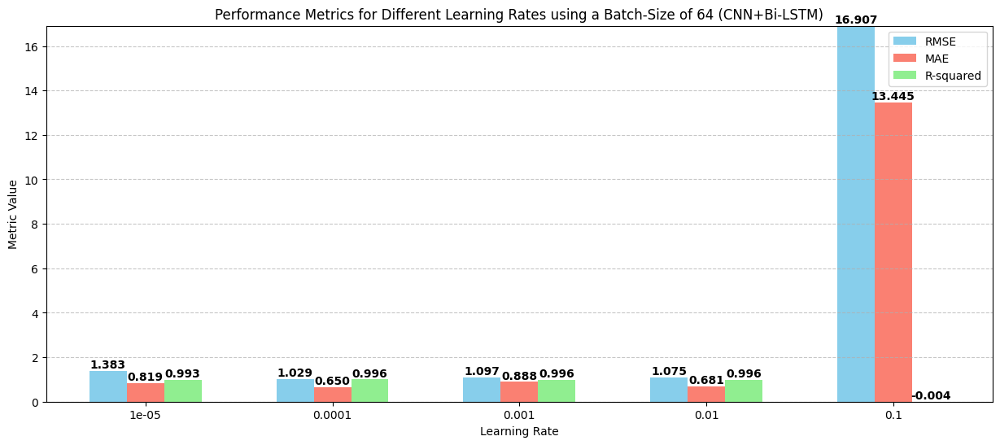

In [15]:
# Extract metrics from the results dictionary
learning_rates_list = list(results.keys())
rmses = [results[lr]['metrics']['RMSE'] for lr in learning_rates_list]
maes = [results[lr]['metrics']['MAE'] for lr in learning_rates_list]
r2s = [results[lr]['metrics']['R-squared'] for lr in learning_rates_list]

# Set width for grouped bars
bar_width = 0.2
x = np.arange(len(learning_rates_list))

plt.figure(figsize=(15, 6))

# Plot bars for RMSE, MAE, and R-squared
plt.bar(x - bar_width, rmses, width=bar_width, color='skyblue', label='RMSE')
plt.bar(x, maes, width=bar_width, color='salmon', label='MAE')
plt.bar(x + bar_width, r2s, width=bar_width, color='lightgreen', label='R-squared')

# Add labels
plt.xlabel('Learning Rate')
plt.ylabel('Metric Value')
plt.title('Performance Metrics for Different Learning Rates using a Batch-Size of 64 (CNN+Bi-LSTM)')
plt.xticks(x, learning_rates_list)  # Set x-axis labels to learning rates
plt.ylim(0, max(max(rmses), max(maes), 1.05))  # Adjust y-axis range
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
def add_value_labels(ax, values, x_positions, offset):
    for i, val in enumerate(values):
        ax.text(x_positions[i], val + offset, f'{val:.3f}', ha='center', va='bottom', fontweight='bold')
ax = plt.gca()
add_value_labels(ax, rmses, x - bar_width, 0.02)
add_value_labels(ax, maes, x, 0.02)
add_value_labels(ax, r2s, x + bar_width, 0.02)
plt.show()

**USING A BATCH SIZE OF 128**

Processing ticker: Walmart
Training with learning rate: 1e-05
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0446 - val_loss: 0.0404
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0397 - val_loss: 0.0337
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0315 - val_loss: 0.0273
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0268 - val_loss: 0.0212
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0196 - val_loss: 0.0155
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0152 - val_loss: 0.0105
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0103 - val_loss: 0.0064
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0075 - val_loss: 0.0038
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0050 - val_loss: 0.0024
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0041 - val_loss: 0.0017
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0036 - val_loss: 0.0013
Epoch 12/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0032 - val_l

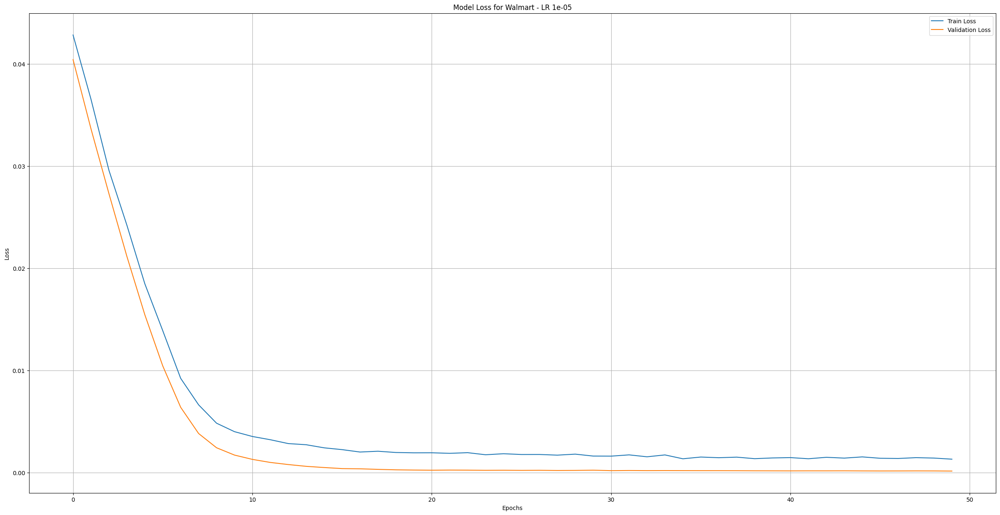

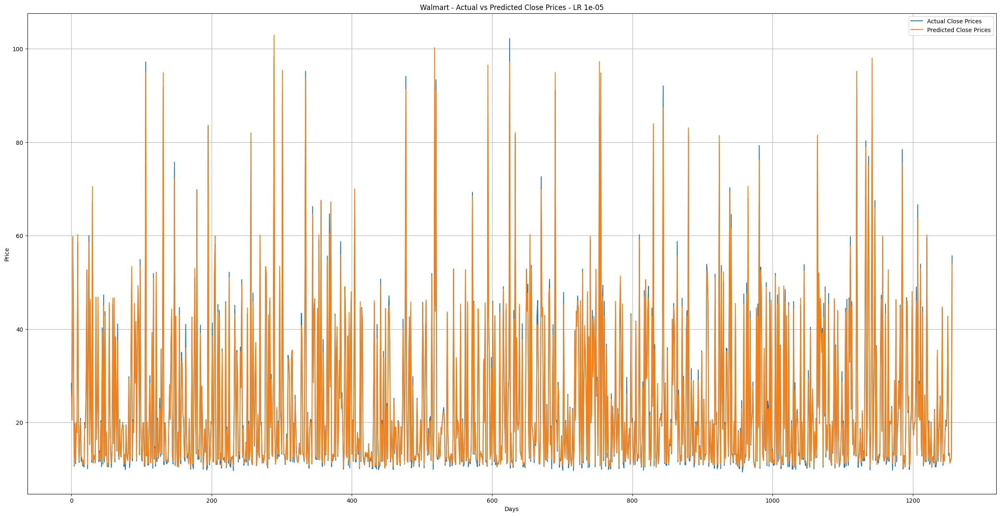

Training with learning rate: 0.0001
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0373 - val_loss: 0.0042
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0049 - val_loss: 6.1429e-04
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0019 - val_loss: 2.8528e-04
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0017 - val_loss: 1.7075e-04
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0015 - val_loss: 2.0699e-04
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0018 - val_loss: 1.9699e-04
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0015 - val_loss: 1.5497e-04
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0016 - val_loss: 1.2716e-04
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0012 - val_loss: 1.2253e-04
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0014 - val_loss: 1.1625e-04
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0012 - val_loss: 1.1995e-04
Epoch 12/50
32/32 ━━━━━━━━━━━━━━━━

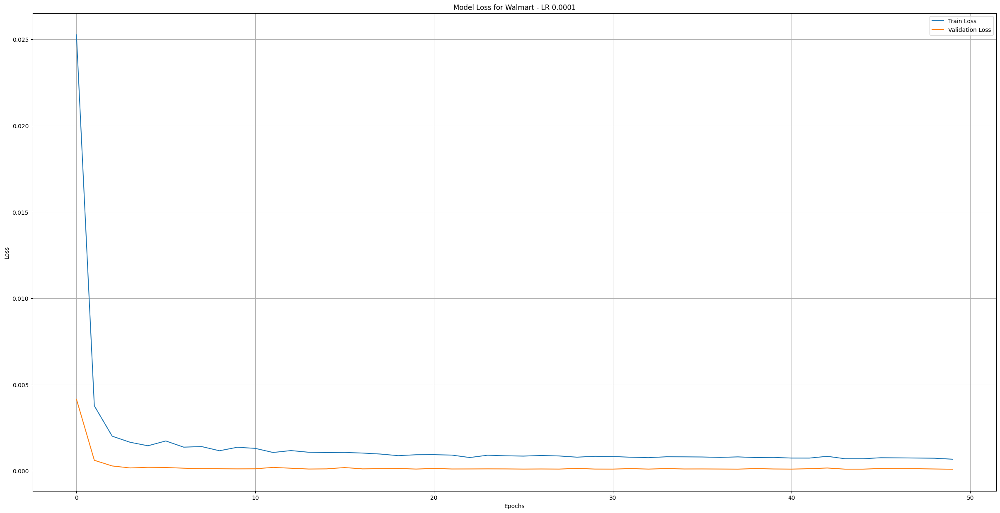

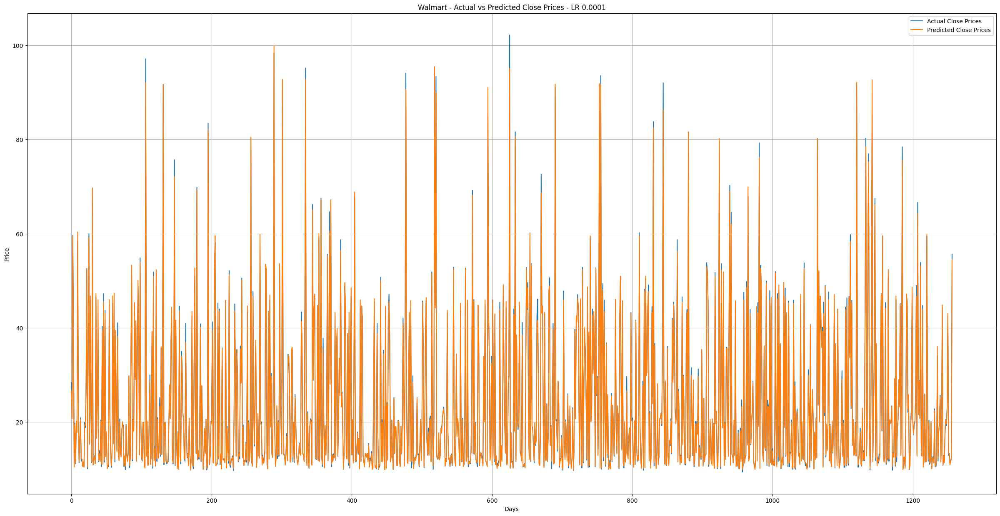

Training with learning rate: 0.001
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0125 - val_loss: 2.0258e-04
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0012 - val_loss: 1.3903e-04
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0011 - val_loss: 1.2781e-04
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 9.5087e-04 - val_loss: 1.2391e-04
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 9.5299e-04 - val_loss: 1.2743e-04
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 8.4316e-04 - val_loss: 3.3480e-04
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 9.0489e-04 - val_loss: 1.0872e-04
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 9.0208e-04 - val_loss: 1.0744e-04
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 7.5197e-04 - val_loss: 1.3389e-04
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 8.5697e-04 - val_loss: 8.8880e-05
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.5677e-04 - val_loss: 1.9134e-0

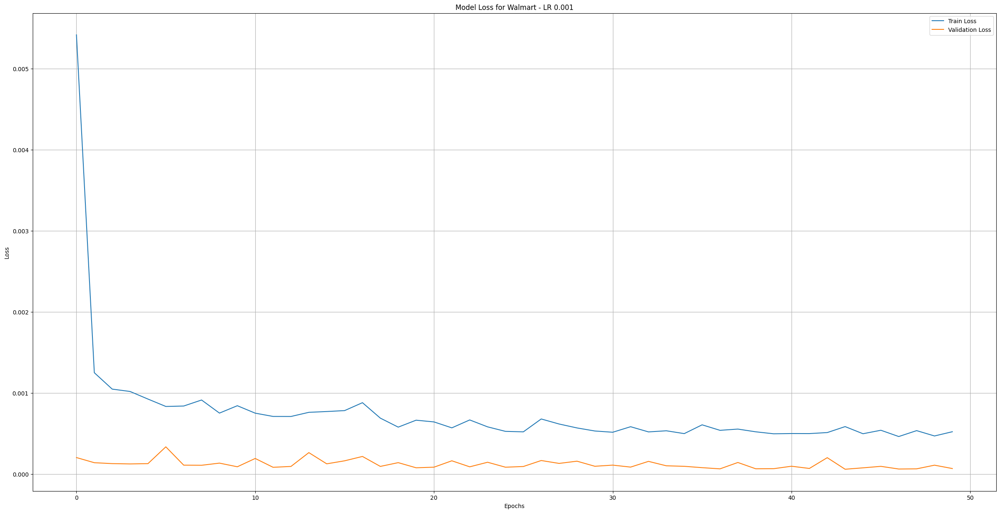

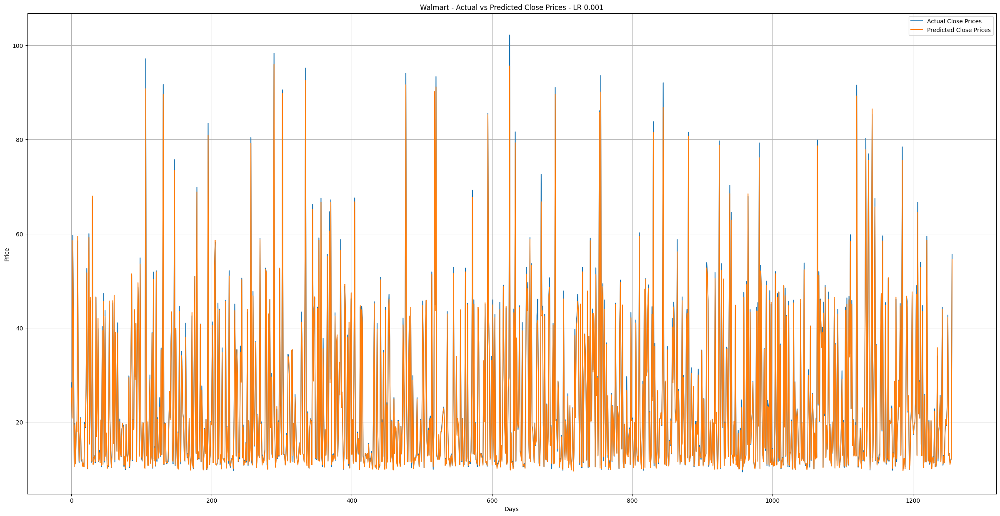

Training with learning rate: 0.01
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0238 - val_loss: 5.0225e-04
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0015 - val_loss: 3.4956e-04
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0011 - val_loss: 1.6367e-04
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 8.7789e-04 - val_loss: 1.6105e-04
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0010 - val_loss: 1.0537e-04
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 7.5113e-04 - val_loss: 3.9060e-04
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 8.3361e-04 - val_loss: 1.1084e-04
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 7.0217e-04 - val_loss: 1.6814e-04
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 8.3524e-04 - val_loss: 5.8211e-04
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 8.3632e-04 - val_loss: 8.4517e-05
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 7.3557e-04 - val_loss: 6.9479e-05
Ep

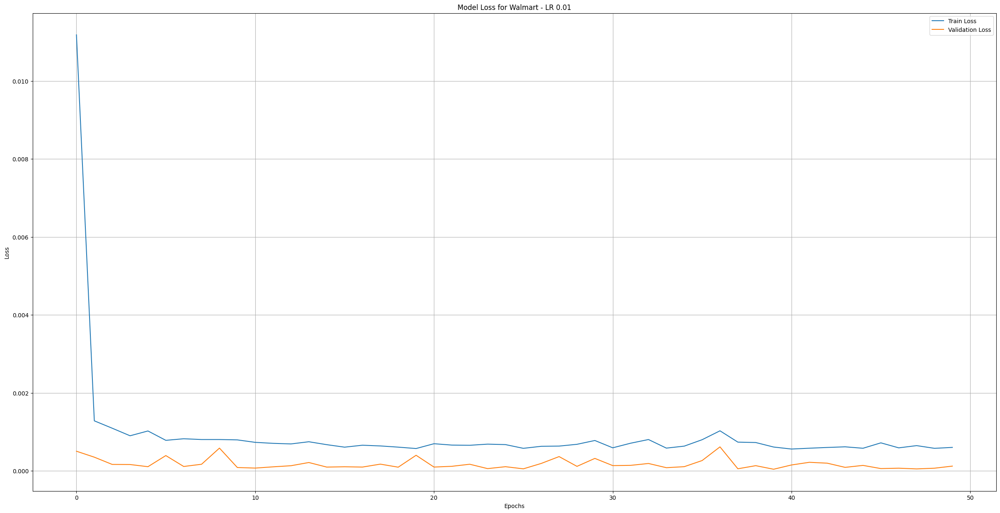

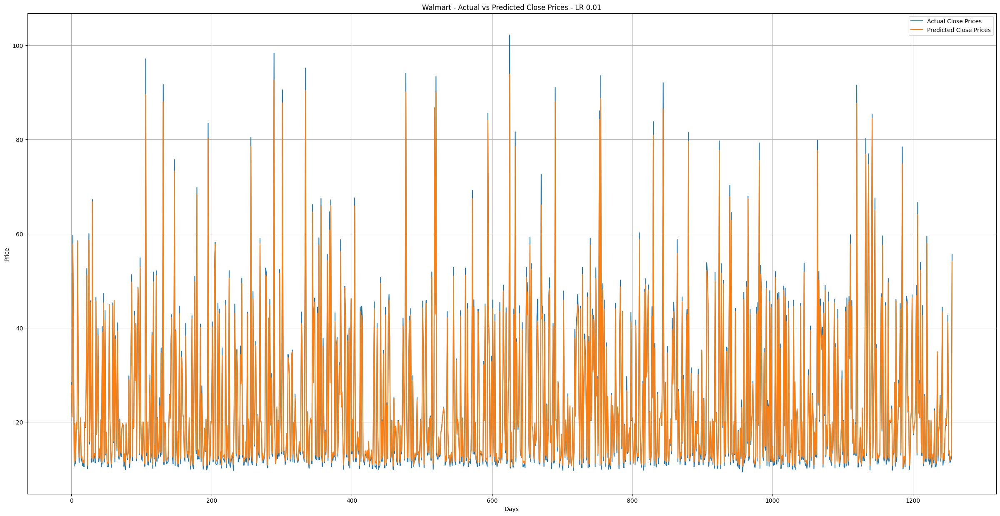

Training with learning rate: 0.1
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 12.2928 - val_loss: 0.0323
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0961 - val_loss: 0.0377
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0454 - val_loss: 0.0334
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0357 - val_loss: 0.0324
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0330 - val_loss: 0.0317
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0317 - val_loss: 0.0343
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0349 - val_loss: 0.0317
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0306 - val_loss: 0.0316
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0332 - val_loss: 0.0316
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0336 - val_loss: 0.0356
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0334 - val_loss: 0.0344
Epoch 12/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0355 - val_

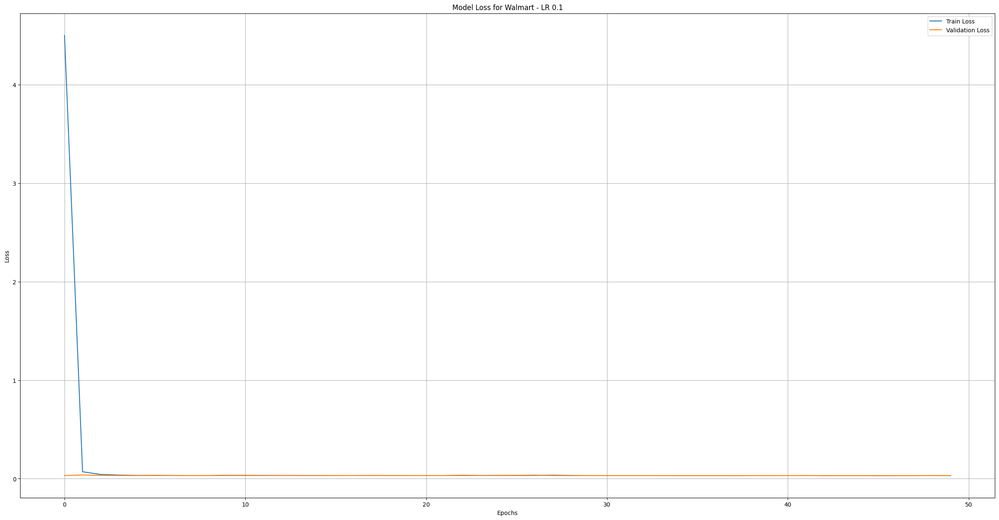

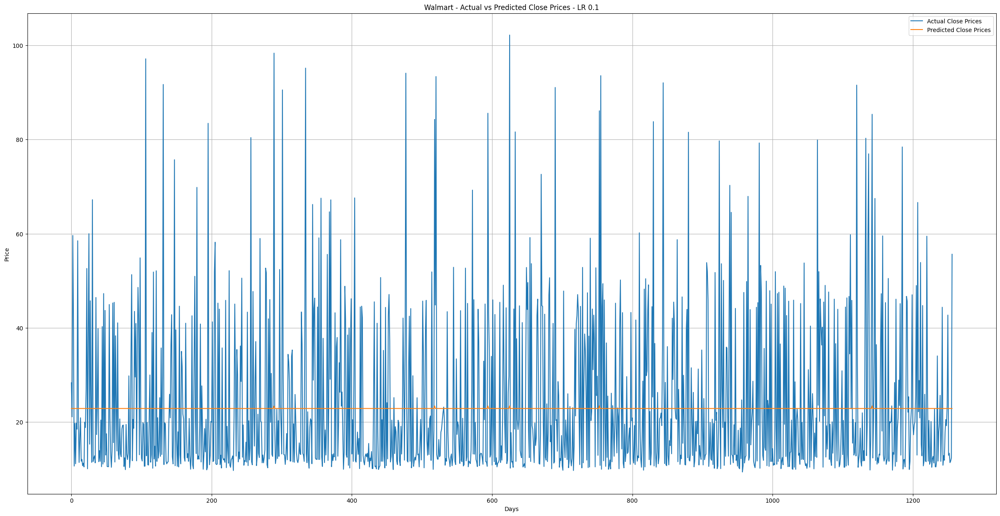

,0.00001,0.00010,0.00100,0.01000,0.10000
0,25.841412,26.591284,27.226913,27.786579,22.884714
1,20.503641,20.735846,20.831760,21.076109,22.884705
2,59.827080,59.506237,58.528515,57.784966,22.884781
3,35.538403,36.334599,37.119839,37.297810,22.884733
4,10.874727,10.447724,10.538943,11.426690,22.884689


In [16]:
def fit_lstm_individual(df, look_back=60, epochs=50, batch_size=128, learning_rates=[0.00001, 0.0001, 0.001, 0.01, 0.1]):
    """
    Fits an LSTM model to the adjusted close prices for Netflix using different learning rates.

    Parameters:
    - df: DataFrame containing adjusted close prices.
    - look_back: Number of past time steps to use as input features.
    - epochs: Number of epochs for training.
    - batch_size: Batch size for training.
    - learning_rates: List of learning rates to iterate over.

    Returns:
    - A dictionary with learning rates as keys and their trained models and predictions as values.
    - A DataFrame containing the predictions for Walmart.
    """
    results = {}
    predictions_dict = {}
    scaler = MinMaxScaler(feature_range=(0, 1))

    print("Processing ticker: Walmart")
    ticker_data = df["adj_close"].values.reshape(-1, 1)
    ticker_scaled = scaler.fit_transform(ticker_data)

    # Create dataset for time series modeling
    def create_dataset(data, look_back):
        X, Y = [], []
        for i in range(look_back, len(data)):
            X.append(data[i - look_back:i, 0])
            Y.append(data[i, 0])
        return np.array(X), np.array(Y)

    X, y = create_dataset(ticker_scaled, look_back)

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Reshape input for LSTM
    X_train = X_train.reshape(X_train.shape[0], look_back, 1)
    X_test = X_test.reshape(X_test.shape[0], look_back, 1)

    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # LSTM model
        model = Sequential()
        model.add(LSTM(100, return_sequences=True, input_shape=(look_back, 1)))
        model.add(Dropout(0.5))
        model.add(LSTM(100, return_sequences=False))
        model.add(Dropout(0.5))
        model.add(Dense(1))

        # Compile the model
        optimizer = Adam(learning_rate=lr)
        model.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = model.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            validation_split=0.2,
            verbose=1
        )

        # Predictions
        y_pred = model.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Save predictions
        predictions_dict[lr] = y_pred_inv.flatten()

        # Calculate metrics
        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        r_squared = r2_score(y_test_inv, y_pred_inv)
        final_loss = history.history['loss'][-1]

        print(f"Walmart - Learning Rate: {lr} - RMSE: {rmse}, MAE: {mae}, R-squared: {r_squared}, Loss: {final_loss}")

        # Save results
        results[lr] = {
            'model': model,
            'predictions': y_pred_inv,
            'actuals': y_test_inv,
            'metrics': {
                'RMSE': rmse,
                'MAE': mae,
                'R-squared': r_squared,
                'Loss': final_loss
            },
            'history': history.history
        }

        # Plot training & validation loss
        plt.figure(figsize=(30, 15))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss for Walmart - LR {lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the results
        plt.figure(figsize=(30, 15))
        plt.plot(y_test_inv, label='Actual Close Prices')
        plt.plot(y_pred_inv, label='Predicted Close Prices')
        plt.title(f'Walmart - Actual vs Predicted Close Prices - LR {lr}')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Convert predictions dictionary to DataFrame
    prediction = pd.DataFrame(predictions_dict)
    return results, prediction

results, prediction = fit_lstm_individual(df)
prediction.head()

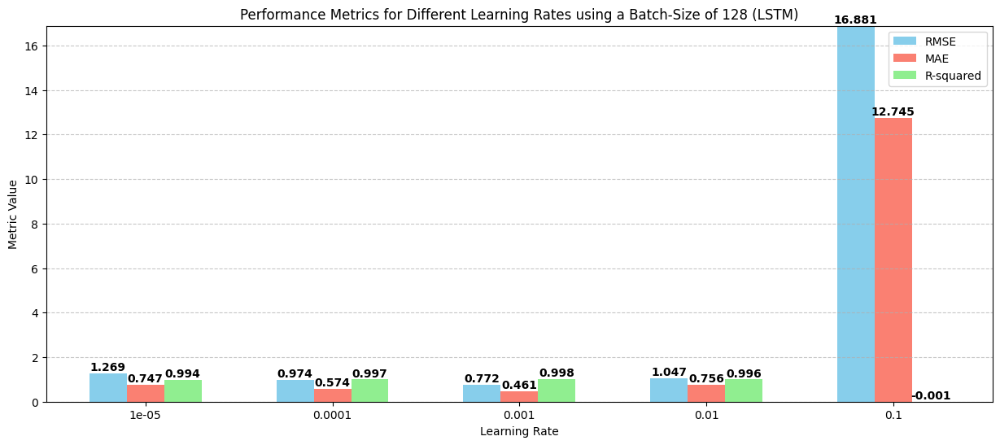

In [17]:
# Extract metrics from the results dictionary
learning_rates_list = list(results.keys())
rmses = [results[lr]['metrics']['RMSE'] for lr in learning_rates_list]
maes = [results[lr]['metrics']['MAE'] for lr in learning_rates_list]
r2s = [results[lr]['metrics']['R-squared'] for lr in learning_rates_list]

# Set width for grouped bars
bar_width = 0.2
x = np.arange(len(learning_rates_list))

plt.figure(figsize=(15, 6))

# Plot bars for RMSE, MAE, and R-squared
plt.bar(x - bar_width, rmses, width=bar_width, color='skyblue', label='RMSE')
plt.bar(x, maes, width=bar_width, color='salmon', label='MAE')
plt.bar(x + bar_width, r2s, width=bar_width, color='lightgreen', label='R-squared')

# Add labels
plt.xlabel('Learning Rate')
plt.ylabel('Metric Value')
plt.title('Performance Metrics for Different Learning Rates using a Batch-Size of 128 (LSTM)')
plt.xticks(x, learning_rates_list)  # Set x-axis labels to learning rates
plt.ylim(0, max(max(rmses), max(maes), 1.05))  # Adjust y-axis range
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
def add_value_labels(ax, values, x_positions, offset):
    for i, val in enumerate(values):
        ax.text(x_positions[i], val + offset, f'{val:.3f}', ha='center', va='bottom', fontweight='bold')
ax = plt.gca()
add_value_labels(ax, rmses, x - bar_width, 0.02)
add_value_labels(ax, maes, x, 0.02)
add_value_labels(ax, r2s, x + bar_width, 0.02)
plt.show()

Processing ticker: Walmart
Training with learning rate: 1e-05
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 38s 318ms/step - loss: 0.0507 - val_loss: 0.0451
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.0398 - val_loss: 0.0359
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0352 - val_loss: 0.0273
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.0237 - val_loss: 0.0200
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0197 - val_loss: 0.0139
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.0137 - val_loss: 0.0098
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0100 - val_loss: 0.0071
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.0072 - val_loss: 0.0050
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.0058 - val_loss: 0.0034
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0041 - val_loss: 0.0021
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.0026 - val_loss: 0.0013
Epoch 12/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.0020 - v

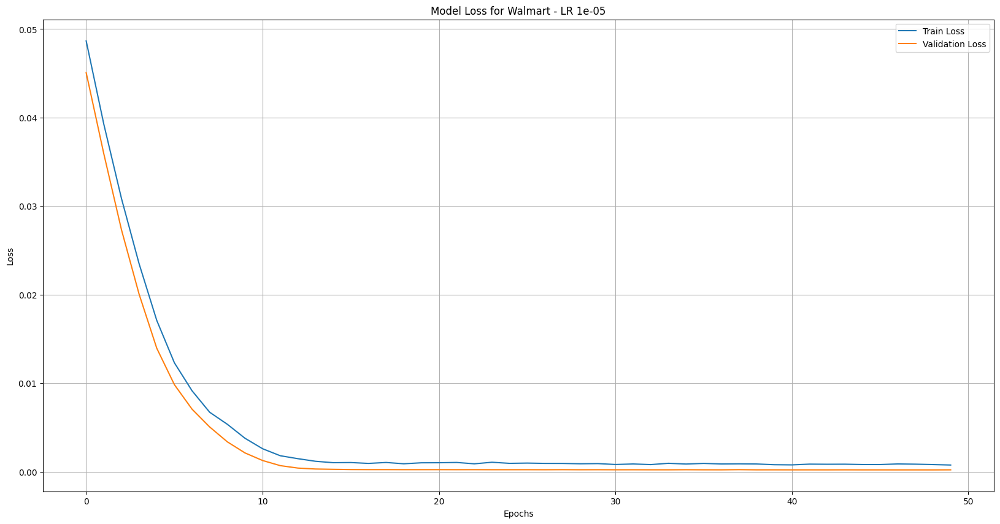

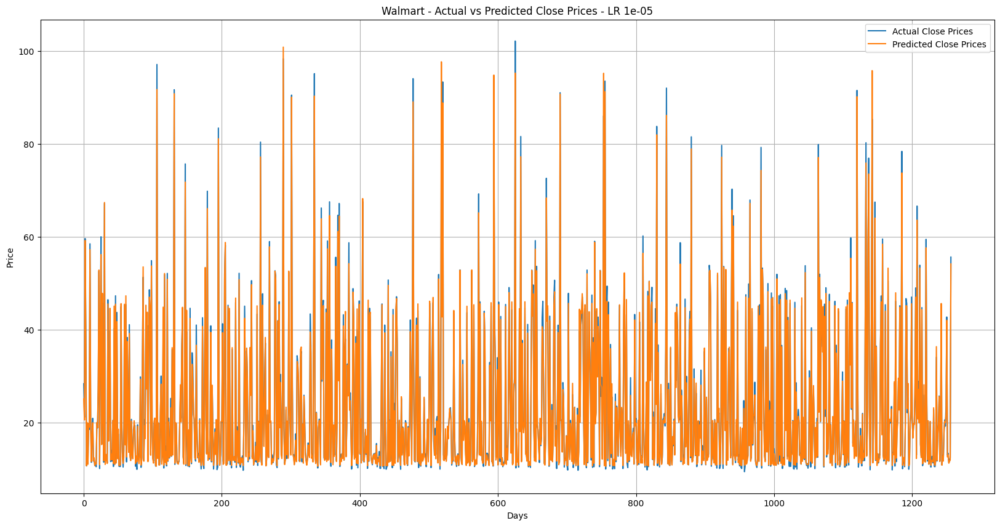

Training with learning rate: 0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 30s 272ms/step - loss: 0.0384 - val_loss: 0.0083
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.0055 - val_loss: 3.9541e-04
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 8.2874e-04 - val_loss: 1.8598e-04
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 8.2972e-04 - val_loss: 1.8095e-04
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 9.1121e-04 - val_loss: 1.7771e-04
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 8.0825e-04 - val_loss: 1.7955e-04
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 8.0205e-04 - val_loss: 1.7158e-04
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 7.5391e-04 - val_loss: 1.9321e-04
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 7.0677e-04 - val_loss: 1.8445e-04
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 6.7873e-04 - val_loss: 1.7044e-04
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 7.0190e-04 - val_lo

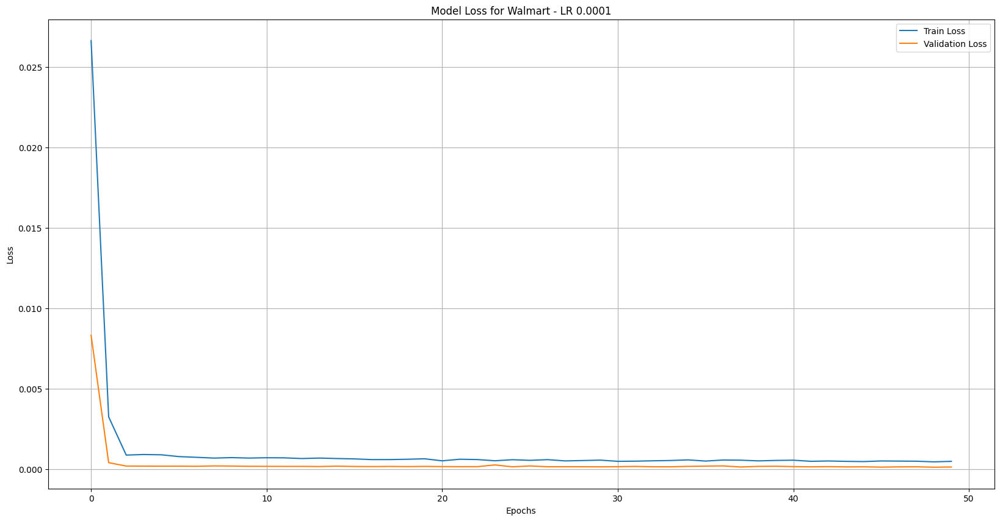

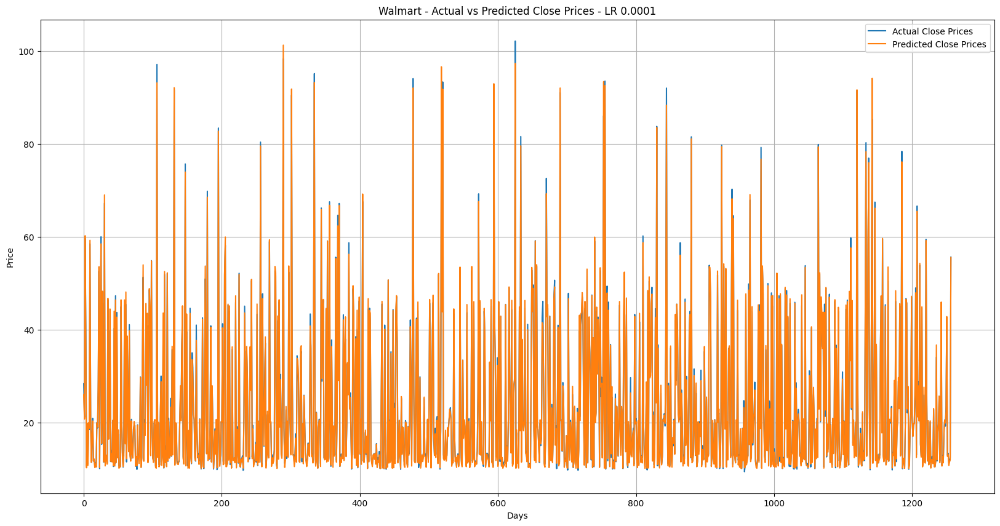

Training with learning rate: 0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 29s 238ms/step - loss: 0.0189 - val_loss: 5.4324e-04
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 8.7019e-04 - val_loss: 1.6402e-04
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 7.6609e-04 - val_loss: 1.3532e-04
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 6.4409e-04 - val_loss: 1.6852e-04
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 5.8555e-04 - val_loss: 3.1524e-04
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 6.6777e-04 - val_loss: 1.4630e-04
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 5.8233e-04 - val_loss: 1.3253e-04
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 6.6850e-04 - val_loss: 1.2334e-04
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 5.1655e-04 - val_loss: 1.3411e-04
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 5.5567e-04 - val_loss: 1.4429e-04
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 4.9539e-04 

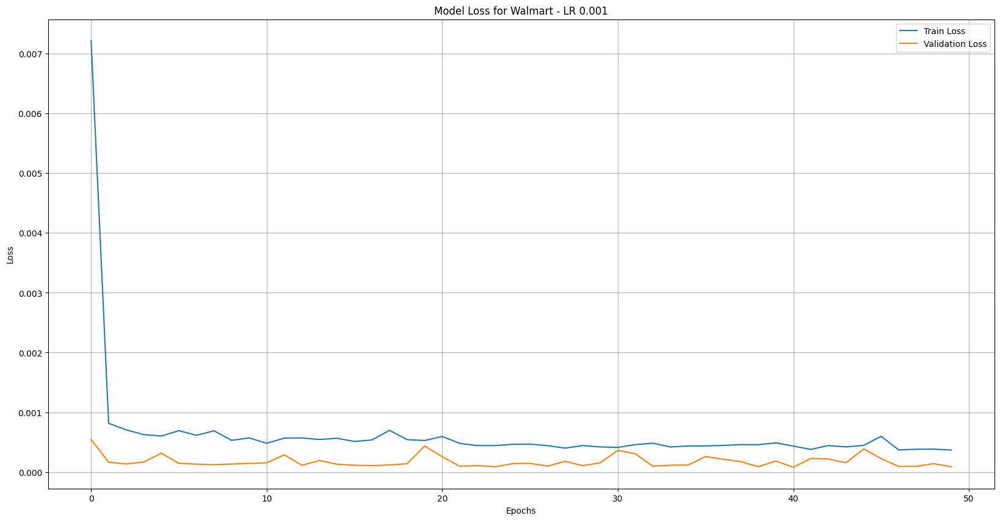

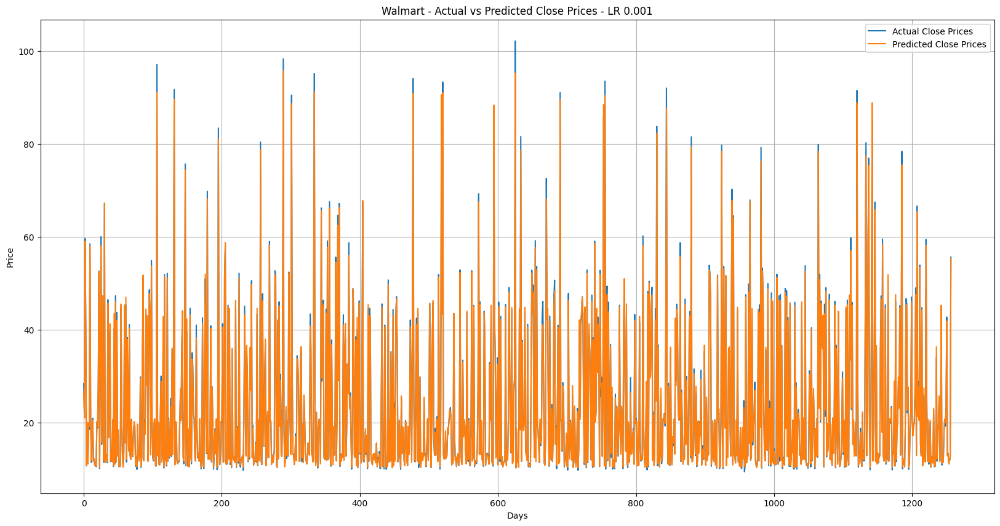

Training with learning rate: 0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 28s 238ms/step - loss: 0.1446 - val_loss: 0.0035
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.0032 - val_loss: 2.4497e-04
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.0012 - val_loss: 1.7198e-04
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 8.6024e-04 - val_loss: 4.7537e-04
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 8.4085e-04 - val_loss: 1.4598e-04
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 9.0723e-04 - val_loss: 4.8399e-04
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 8.8308e-04 - val_loss: 3.8302e-04
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 8.2021e-04 - val_loss: 1.8175e-04
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 7.0793e-04 - val_loss: 1.6634e-04
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 6.6546e-04 - val_loss: 2.9264e-04
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 8.0254e-04 - val_loss: 

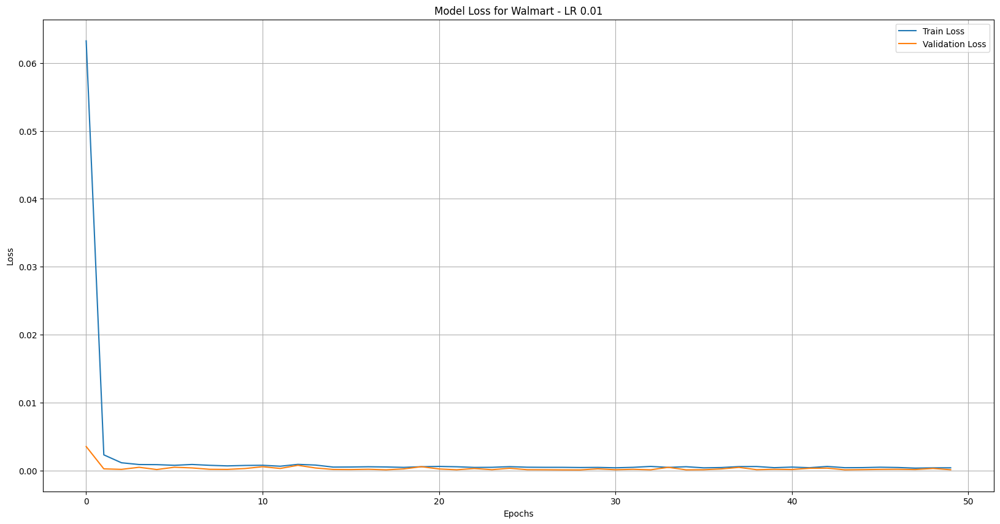

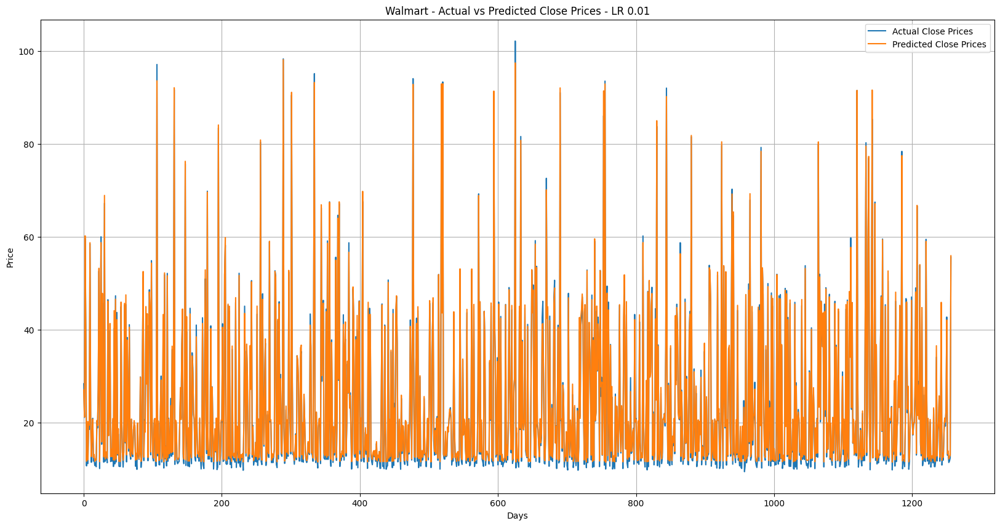

Training with learning rate: 0.1


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 28s 263ms/step - loss: 30.2435 - val_loss: 0.0461
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 1.2151 - val_loss: 0.0547
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1160 - val_loss: 0.0316
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.0376 - val_loss: 0.0339
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.0350 - val_loss: 0.0322
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.0328 - val_loss: 0.0317
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.0335 - val_loss: 0.0317
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.0343 - val_loss: 0.0324
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0332 - val_loss: 0.0338
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.0362 - val_loss: 0.0333
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.0362 - val_loss: 0.0377
Epoch 12/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 

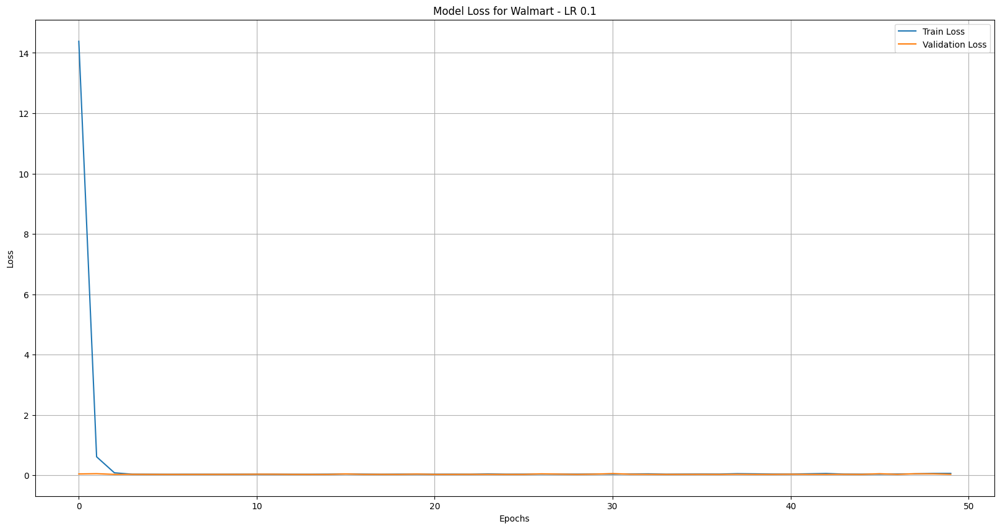

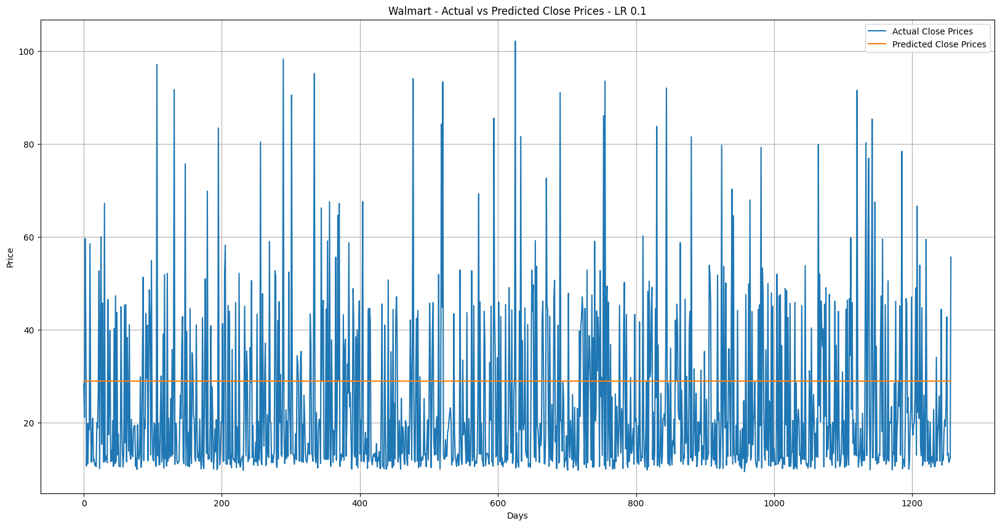

,0.00001,0.00010,0.00100,0.01000,0.10000
0,25.089846,26.000666,26.524666,26.978243,28.911642
1,20.559599,20.739815,20.983152,21.171618,28.911642
2,59.213173,60.238804,59.031799,60.211655,28.911642
3,36.269512,37.101940,37.533840,37.576023,28.911642
4,10.673968,10.246431,10.741228,11.652778,28.911642


In [18]:
def fit_cnn_gru_lstm_individual(df, look_back=60, epochs=50, batch_size=128, learning_rates=[0.00001, 0.0001, 0.001, 0.01, 0.1]):
    """
    Fits an CNN+GRU-LSTM model to the adjusted close prices for Netflix using different learning rates.

    Parameters:
    - df: DataFrame containing adjusted close prices.
    - look_back: Number of past time steps to use as input features.
    - epochs: Number of epochs for training.
    - batch_size: Batch size for training.
    - learning_rates: List of learning rates to iterate over.

    Returns:
    - A dictionary with learning rates as keys and their trained models and predictions as values.
    - A DataFrame containing the predictions for Walmart.
    """
    results = {}
    predictions_dict = {}
    scaler = MinMaxScaler(feature_range=(0, 1))

    print("Processing ticker: Walmart")
    ticker_data = df["adj_close"].values.reshape(-1, 1)
    ticker_scaled = scaler.fit_transform(ticker_data)

    # Create dataset for time series modeling
    def create_dataset(data, look_back):
        X, Y = [], []
        for i in range(look_back, len(data)):
            X.append(data[i - look_back:i, 0])
            Y.append(data[i, 0])
        return np.array(X), np.array(Y)

    X, y = create_dataset(ticker_scaled, look_back)

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Reshape input for CNN-LSTM
    X_train = X_train.reshape(X_train.shape[0], look_back, 1, 1, 1)
    X_test = X_test.reshape(X_test.shape[0], look_back, 1, 1, 1)

    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # CNN+GRU-LSTM model
        gl = Sequential()
        gl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu'),
                               input_shape=(look_back, 1, 1, 1)))
        gl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        gl.add(TimeDistributed(Conv2D(filters=128, kernel_size=(1, 1), activation='relu')))
        gl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        gl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu')))
        gl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        gl.add(TimeDistributed(Flatten()))
        gl.add(Bidirectional(GRU(100, return_sequences=True)))
        gl.add(Dropout(0.5))
        gl.add(Bidirectional(LSTM(100, return_sequences=False)))
        gl.add(Dropout(0.5))
        gl.add(Dense(1))

        # Compile the model
        optimizer = Adam(learning_rate=lr)
        gl.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = gl.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            validation_split=0.2,
            verbose=1
        )

        # Predictions
        y_pred = gl.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Save predictions
        predictions_dict[lr] = y_pred_inv.flatten()

        # Calculate metrics
        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        r_squared = r2_score(y_test_inv, y_pred_inv)
        final_loss = history.history['loss'][-1]

        print(f"Walmart - Learning Rate: {lr} - RMSE: {rmse}, MAE: {mae}, R-squared: {r_squared}, Loss: {final_loss}")

        # Save results
        results[lr] = {
            'model': gl,
            'predictions': y_pred_inv,
            'actuals': y_test_inv,
            'metrics': {
                'RMSE': rmse,
                'MAE': mae,
                'R-squared': r_squared,
                'Loss': final_loss
            },
            'history': history.history
        }

        # Plot training & validation loss
        plt.figure(figsize=(20, 10))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss for Walmart - LR {lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the results
        plt.figure(figsize=(20, 10))
        plt.plot(y_test_inv, label='Actual Close Prices')
        plt.plot(y_pred_inv, label='Predicted Close Prices')
        plt.title(f'Walmart - Actual vs Predicted Close Prices - LR {lr}')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Convert predictions dictionary to DataFrame
    prediction = pd.DataFrame(predictions_dict)
    return results, prediction


results, prediction = fit_cnn_gru_lstm_individual(df)
prediction.head()

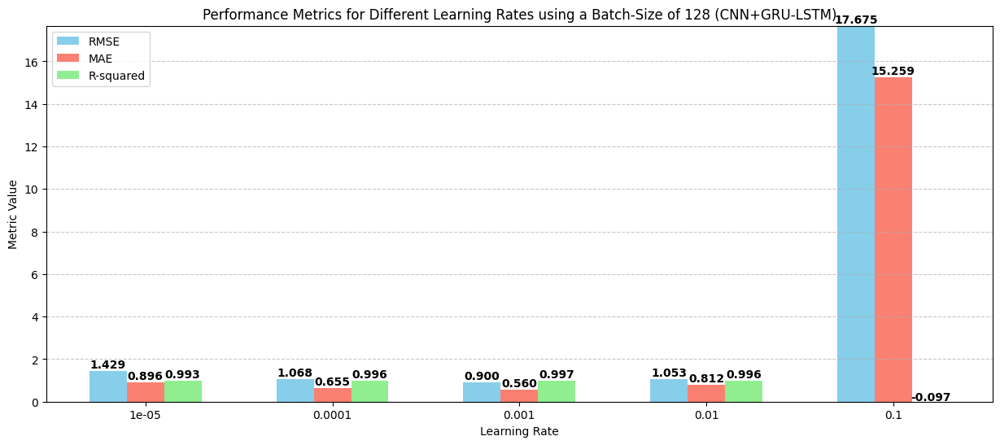

In [19]:
# Extract metrics from the results dictionary
learning_rates_list = list(results.keys())
rmses = [results[lr]['metrics']['RMSE'] for lr in learning_rates_list]
maes = [results[lr]['metrics']['MAE'] for lr in learning_rates_list]
r2s = [results[lr]['metrics']['R-squared'] for lr in learning_rates_list]

# Set width for grouped bars
bar_width = 0.2
x = np.arange(len(learning_rates_list))

plt.figure(figsize=(15, 6))

# Plot bars for RMSE, MAE, and R-squared
plt.bar(x - bar_width, rmses, width=bar_width, color='skyblue', label='RMSE')
plt.bar(x, maes, width=bar_width, color='salmon', label='MAE')
plt.bar(x + bar_width, r2s, width=bar_width, color='lightgreen', label='R-squared')

# Add labels
plt.xlabel('Learning Rate')
plt.ylabel('Metric Value')
plt.title('Performance Metrics for Different Learning Rates using a Batch-Size of 128 (CNN+GRU-LSTM)')
plt.xticks(x, learning_rates_list)  # Set x-axis labels to learning rates
plt.ylim(0, max(max(rmses), max(maes), 1.05))  # Adjust y-axis range
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
def add_value_labels(ax, values, x_positions, offset):
    for i, val in enumerate(values):
        ax.text(x_positions[i], val + offset, f'{val:.3f}', ha='center', va='bottom', fontweight='bold')
ax = plt.gca()
add_value_labels(ax, rmses, x - bar_width, 0.02)
add_value_labels(ax, maes, x, 0.02)
add_value_labels(ax, r2s, x + bar_width, 0.02)
plt.show()

Processing ticker: Walmart
Training with learning rate: 1e-05
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


63/63 ━━━━━━━━━━━━━━━━━━━━ 31s 139ms/step - loss: 0.0469 - val_loss: 0.0347
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0306 - val_loss: 0.0181
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0152 - val_loss: 0.0074
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0071 - val_loss: 0.0034
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step - loss: 0.0037 - val_loss: 0.0014
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step - loss: 0.0020 - val_loss: 5.5446e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0013 - val_loss: 2.5770e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - loss: 0.0011 - val_loss: 2.1792e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 8.8721e-04 - val_loss: 2.3767e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 9.6897e-04 - val_loss: 2.0930e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - loss: 0.0011 - val_loss: 2.0683e-04
Epoch 12/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4

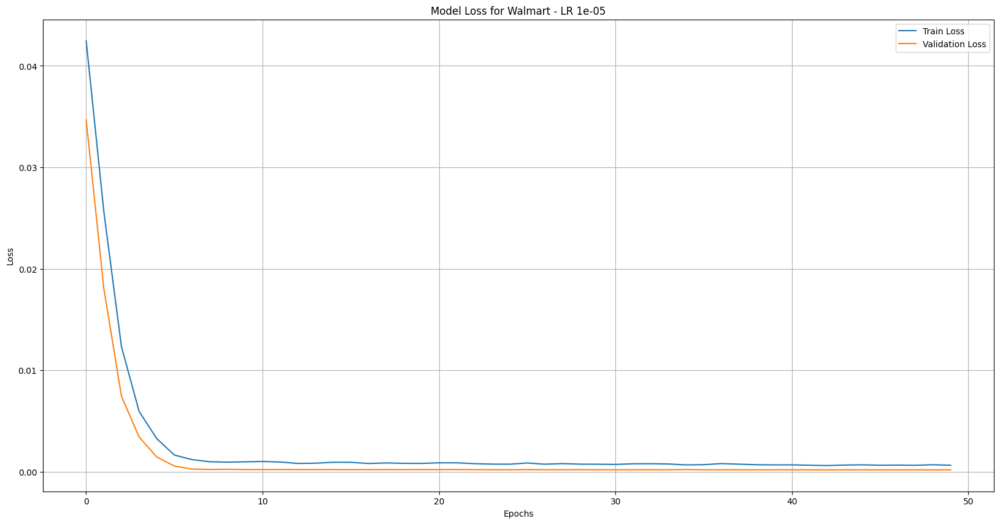

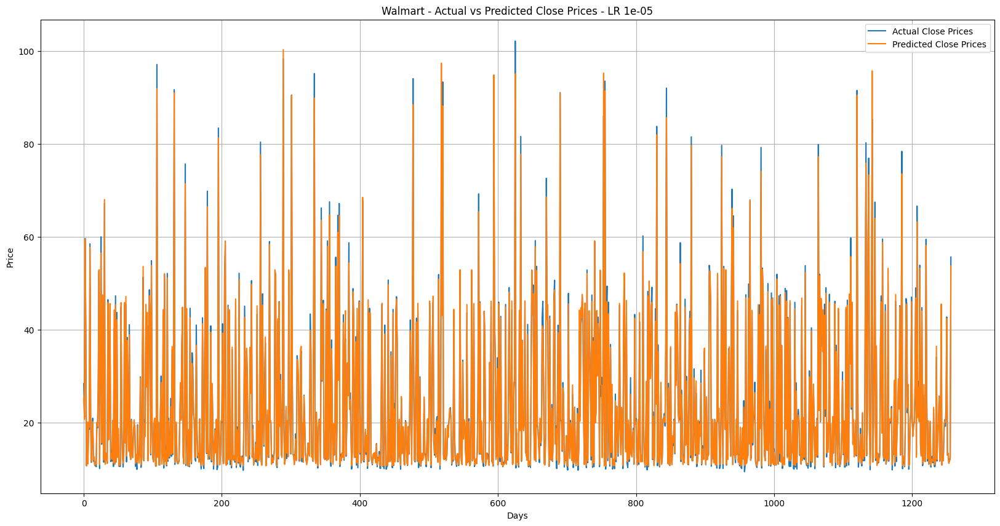

Training with learning rate: 0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 33s 177ms/step - loss: 0.0275 - val_loss: 2.3967e-04
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 9.2478e-04 - val_loss: 2.0095e-04
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 9.2959e-04 - val_loss: 1.8956e-04
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 7.9294e-04 - val_loss: 2.3305e-04
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 7.7046e-04 - val_loss: 1.8307e-04
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 7.8466e-04 - val_loss: 2.9609e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 7.3300e-04 - val_loss: 2.0197e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 6.3517e-04 - val_loss: 2.1176e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 6.8693e-04 - val_loss: 2.0376e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 7.0836e-04 - val_loss: 1.6523e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - loss: 5.2593e-04

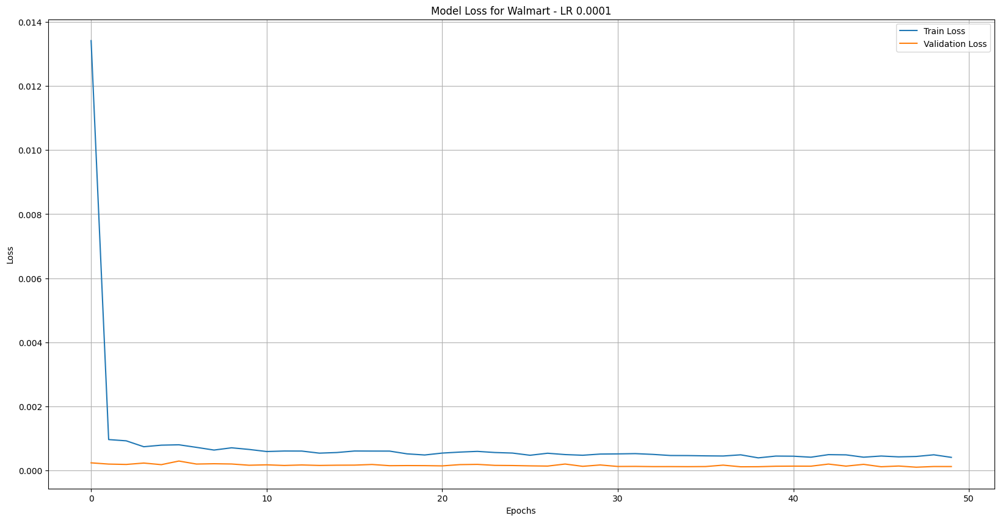

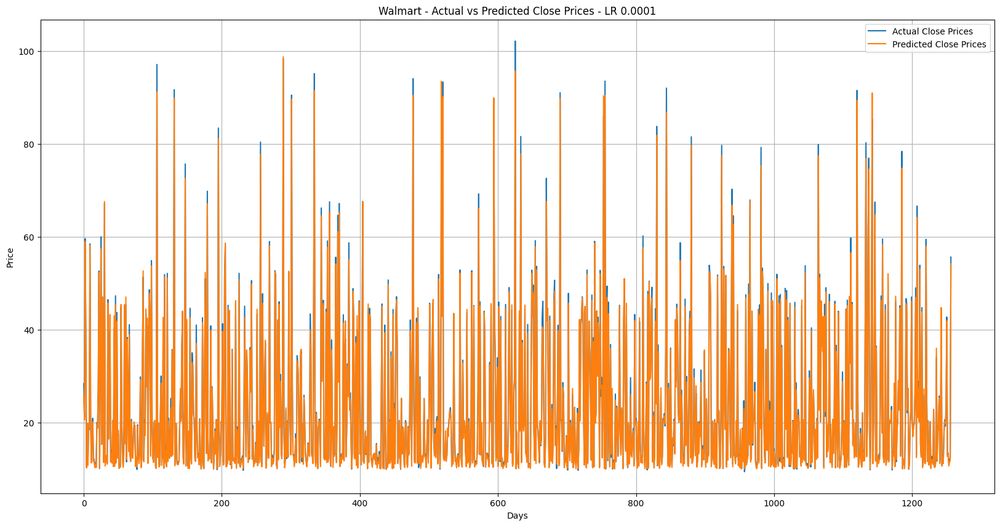

Training with learning rate: 0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0118 - val_loss: 2.6853e-04
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 7.9441e-04 - val_loss: 4.6459e-04
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0013 - val_loss: 4.1514e-04
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 7.9234e-04 - val_loss: 1.2897e-04
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step - loss: 7.0270e-04 - val_loss: 3.0727e-04
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 6.8786e-04 - val_loss: 2.2601e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 5.4374e-04 - val_loss: 1.1734e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 5.9343e-04 - val_loss: 1.1005e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 6.1572e-04 - val_loss: 2.3302e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 5.0283e-04 - val_loss: 1.3151e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 6.4591e-04 - v

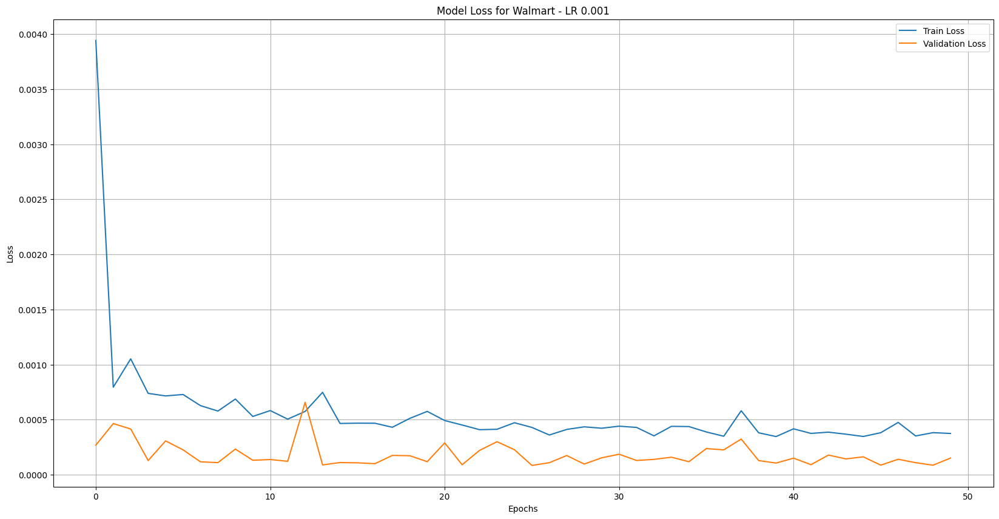

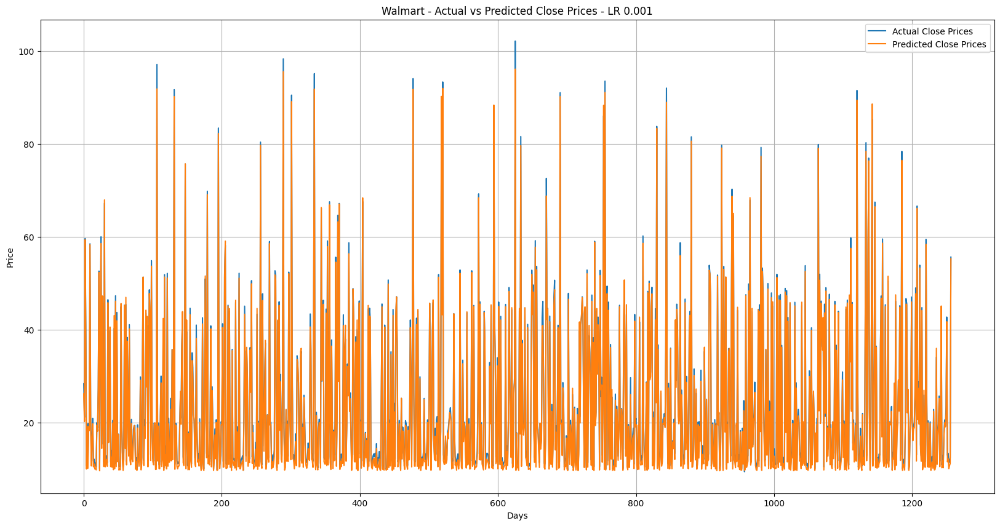

Training with learning rate: 0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.1061 - val_loss: 3.0088e-04
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.0013 - val_loss: 2.5569e-04
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0012 - val_loss: 0.0013
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0013 - val_loss: 1.9108e-04
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 9.1111e-04 - val_loss: 3.7729e-04
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 8.9375e-04 - val_loss: 2.1807e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 9.1749e-04 - val_loss: 1.4943e-04
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 8.6653e-04 - val_loss: 2.3524e-04
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 6.6599e-04 - val_loss: 2.1760e-04
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 5.4567e-04 - val_loss: 2.0304e-04
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 6.5769e-04 - val_loss: 2.5

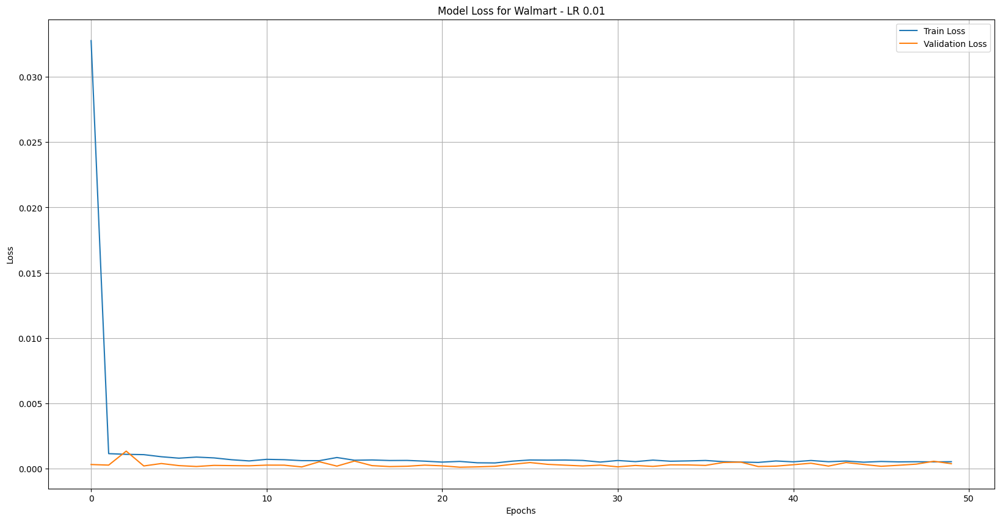

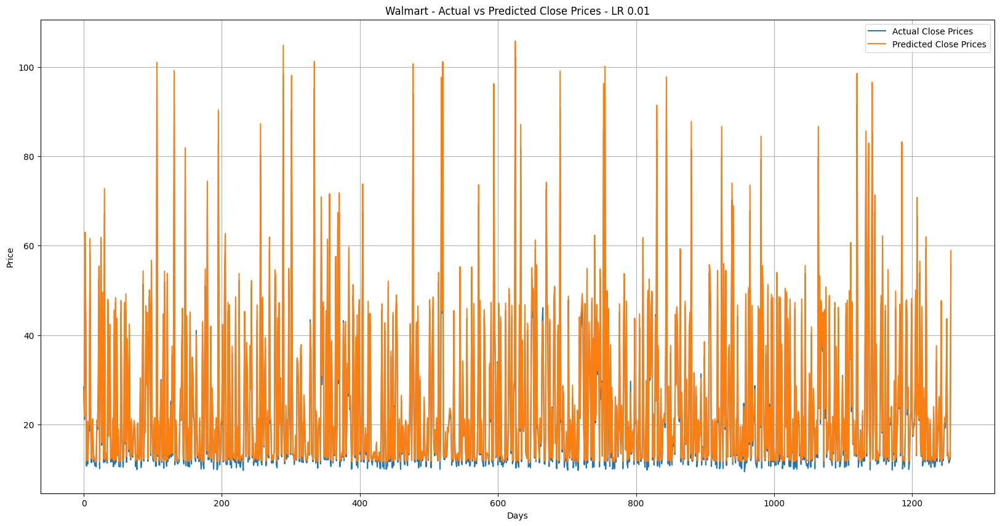

Training with learning rate: 0.1


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 32s 170ms/step - loss: 9.2747 - val_loss: 0.0317
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.0589 - val_loss: 0.0363
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.0462 - val_loss: 0.0406
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.0504 - val_loss: 0.0408
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.0435 - val_loss: 0.0406
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.0444 - val_loss: 0.0316
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.0401 - val_loss: 0.1068
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.0793 - val_loss: 0.0545
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.0657 - val_loss: 0.0474
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.0543 - val_loss: 0.0491
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.0547 - val_loss: 0.0369
Epoch 12/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 

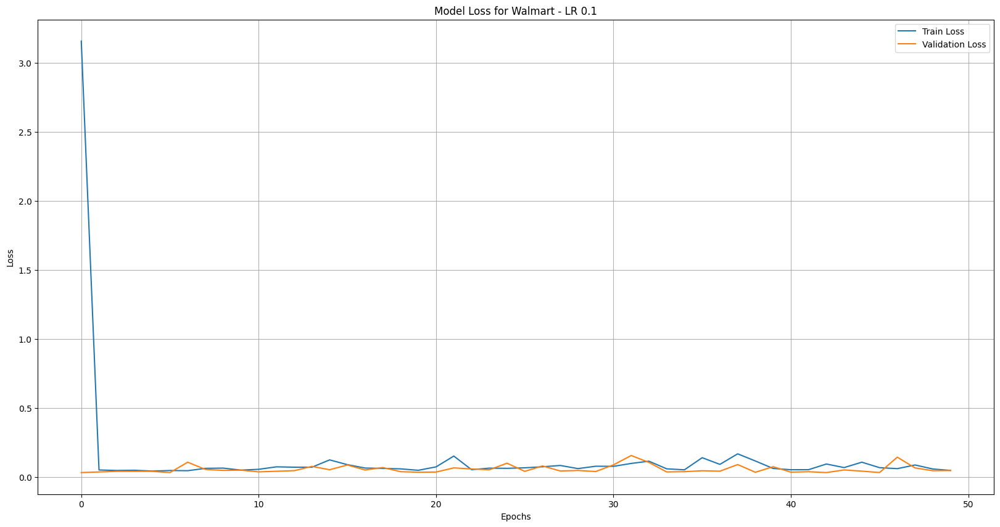

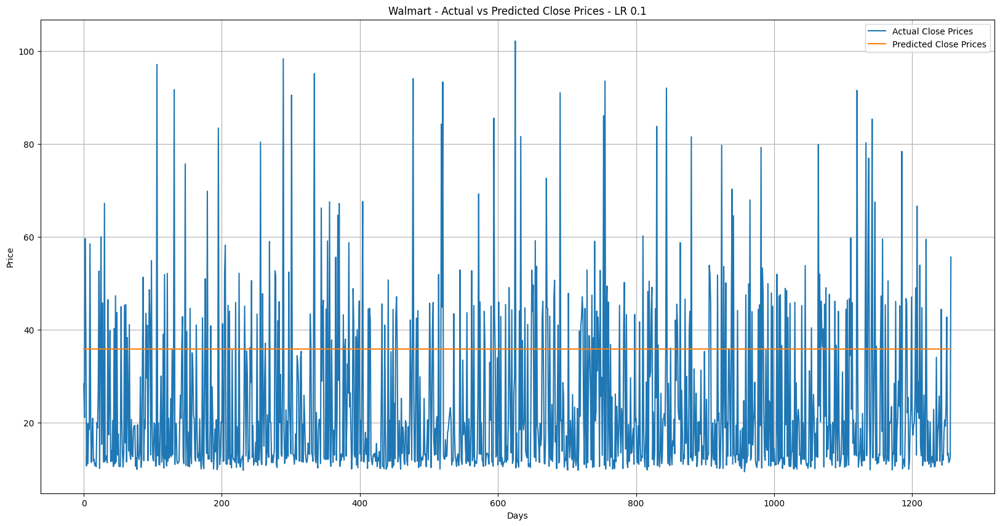

,0.00001,0.00010,0.00100,0.01000,0.10000
0,25.309057,25.717215,26.163029,27.640076,35.834736
1,20.679453,20.555920,20.221861,21.781948,35.834736
2,59.507549,58.982094,59.367844,62.994350,35.834736
3,36.282379,36.463387,37.390171,39.229572,35.834736
4,10.689554,10.221803,9.978205,11.835703,35.834736


In [20]:
def fit_cnn_bi_lstm_individual(df, look_back=60, epochs=50, batch_size=64, learning_rates=[0.00001, 0.0001, 0.001, 0.01, 0.1]):
    """
    Fits an CNN+BI-LSTM model to the adjusted close prices for Netflix using different learning rates.

    Parameters:
    - df: DataFrame containing adjusted close prices.
    - look_back: Number of past time steps to use as input features.
    - epochs: Number of epochs for training.
    - batch_size: Batch size for training.
    - learning_rates: List of learning rates to iterate over.

    Returns:
    - A dictionary with learning rates as keys and their trained models and predictions as values.
    - A DataFrame containing the predictions for Walmart.
    """
    results = {}
    predictions_dict = {}
    scaler = MinMaxScaler(feature_range=(0, 1))

    print("Processing ticker: Walmart")
    ticker_data = df["adj_close"].values.reshape(-1, 1)
    ticker_scaled = scaler.fit_transform(ticker_data)

    # Create dataset for time series modeling
    def create_dataset(data, look_back):
        X, Y = [], []
        for i in range(look_back, len(data)):
            X.append(data[i - look_back:i, 0])
            Y.append(data[i, 0])
        return np.array(X), np.array(Y)

    X, y = create_dataset(ticker_scaled, look_back)

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Reshape input for CNN-LSTM
    X_train = X_train.reshape(X_train.shape[0], look_back, 1, 1, 1)
    X_test = X_test.reshape(X_test.shape[0], look_back, 1, 1, 1)

    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # CNN+GRU-LSTM model
        cl = Sequential()
        cl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu'),
                               input_shape=(look_back, 1, 1, 1)))
        cl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cl.add(TimeDistributed(Conv2D(filters=128, kernel_size=(1, 1), activation='relu')))
        cl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu')))
        cl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        cl.add(TimeDistributed(Flatten()))
        cl.add(Bidirectional(LSTM(100, return_sequences=True)))
        cl.add(Dropout(0.5))
        cl.add(Bidirectional(LSTM(100, return_sequences=False)))
        cl.add(Dropout(0.5))
        cl.add(Dense(1))

        # Compile the model
        optimizer = Adam(learning_rate=lr)
        cl.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = cl.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            validation_split=0.2,
            verbose=1
        )

        # Predictions
        y_pred = cl.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Save predictions
        predictions_dict[lr] = y_pred_inv.flatten()

        # Calculate metrics
        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        r_squared = r2_score(y_test_inv, y_pred_inv)
        final_loss = history.history['loss'][-1]

        print(f"Walmart - Learning Rate: {lr} - RMSE: {rmse}, MAE: {mae}, R-squared: {r_squared}, Loss: {final_loss}")

        # Save results
        results[lr] = {
            'model': cl,
            'predictions': y_pred_inv,
            'actuals': y_test_inv,
            'metrics': {
                'RMSE': rmse,
                'MAE': mae,
                'R-squared': r_squared,
                'Loss': final_loss
            },
            'history': history.history
        }

        # Plot training & validation loss
        plt.figure(figsize=(20, 10))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss for Walmart - LR {lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the results
        plt.figure(figsize=(20, 10))
        plt.plot(y_test_inv, label='Actual Close Prices')
        plt.plot(y_pred_inv, label='Predicted Close Prices')
        plt.title(f'Walmart - Actual vs Predicted Close Prices - LR {lr}')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Convert predictions dictionary to DataFrame
    prediction = pd.DataFrame(predictions_dict)
    return results, prediction


results, prediction = fit_cnn_bi_lstm_individual(df)
prediction.head()

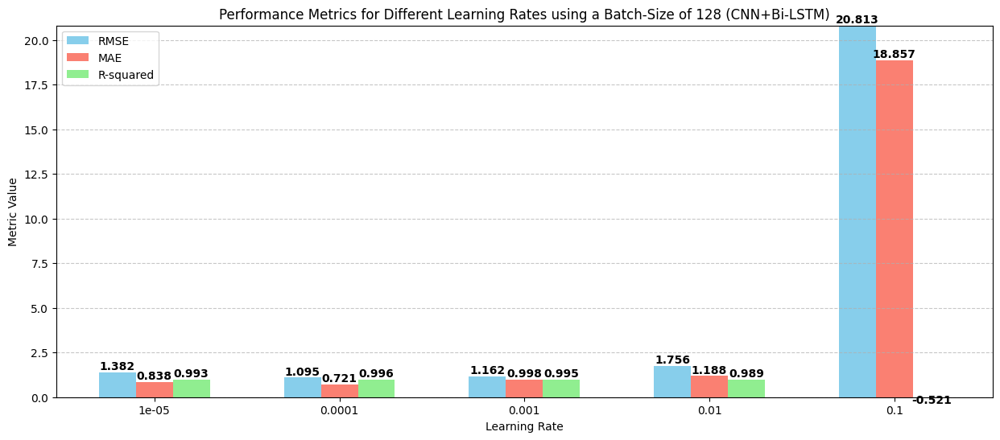

In [21]:
# Extract metrics from the results dictionary
learning_rates_list = list(results.keys())
rmses = [results[lr]['metrics']['RMSE'] for lr in learning_rates_list]
maes = [results[lr]['metrics']['MAE'] for lr in learning_rates_list]
r2s = [results[lr]['metrics']['R-squared'] for lr in learning_rates_list]

# Set width for grouped bars
bar_width = 0.2
x = np.arange(len(learning_rates_list))

plt.figure(figsize=(15, 6))

# Plot bars for RMSE, MAE, and R-squared
plt.bar(x - bar_width, rmses, width=bar_width, color='skyblue', label='RMSE')
plt.bar(x, maes, width=bar_width, color='salmon', label='MAE')
plt.bar(x + bar_width, r2s, width=bar_width, color='lightgreen', label='R-squared')

# Add labels
plt.xlabel('Learning Rate')
plt.ylabel('Metric Value')
plt.title('Performance Metrics for Different Learning Rates using a Batch-Size of 128 (CNN+Bi-LSTM)')
plt.xticks(x, learning_rates_list)  # Set x-axis labels to learning rates
plt.ylim(0, max(max(rmses), max(maes), 1.05))  # Adjust y-axis range
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
def add_value_labels(ax, values, x_positions, offset):
    for i, val in enumerate(values):
        ax.text(x_positions[i], val + offset, f'{val:.3f}', ha='center', va='bottom', fontweight='bold')
ax = plt.gca()
add_value_labels(ax, rmses, x - bar_width, 0.02)
add_value_labels(ax, maes, x, 0.02)
add_value_labels(ax, r2s, x + bar_width, 0.02)
plt.show()